<a href="https://colab.research.google.com/github/cpelizza/Text-Mining-and-Search/blob/main/extract_embedding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Connect to model on WandB

In [1]:
!pip install wandb
import wandb


In [2]:

import os
os.environ["WANDB_API_KEY"] = "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"
#wandb.login() #automatically uses the apy key

In [3]:
!wandb login

wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.
wandb: Currently logged in as: c-pelizza2 (c-pelizza2-bicocca) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [ ]:
# connect to CLAP project
run = wandb.init(project = "CLAP")

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)


In [ ]:
# connect to a specific model (consider its latest run)
artifact = run.use_artifact("c-pelizza2-bicocca/CLAP/model-11ts0skt:latest", type = "model")

In [ ]:
# download the model from wandb
artifact_dir = artifact.download()
#inspect donwoloaded files
print(os.listdir(artifact_dir))
#we have "model.ckpt"

In [ ]:
# import model's class
config = artifact.metadata
print(config)

In [ ]:
import torch

model = torch.load(f"{artifact_dir}/model.ckpt",  map_location="cpu")

# CLAP definition

In [ ]:
pip install lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 853.6/853.6 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 857.3/857.3 kB 27.5 MB/s eta 0:00:00


In [ ]:
import requests
import gzip
import os

from __future__ import absolute_import, division, print_function

import os

import PIL
import numpy as np
import tensorflow.compat.v1 as tf
import torch
from six.moves import range
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset

from pathlib import Path
from torch.utils.data.sampler import Sampler
from torchvision.transforms import Compose, Grayscale, Normalize, Resize, ToTensor
from typing import Any, Dict, List, Optional, Tuple

from dataclasses import dataclass, field, fields
from lightning.pytorch import LightningDataModule


import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Normal


import lightning as L

import logging
import logging.handlers
from lightning.pytorch import seed_everything
from torch.utils.data import DataLoader, Dataset, Subset

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


## data

### downloand small norb

In [ ]:
## dataset
!pip install datasets

## download SmallNORB
print("Downloading small_norb.")
output_dir = "small_norb"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def download_and_gunzip(url, output_path):
    print(f"Downloading {url} to {output_path}.gz")
    response = requests.get(url, stream=True)
    response.raise_for_status() # Raise an HTTPError for bad responses (4xx or 5xx)

    with open(output_path + ".gz", 'wb') as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)

    print(f"Decompressing {output_path}.gz")
    with gzip.open(output_path + ".gz", 'rb') as f_in:
        with open(output_path, 'wb') as f_out:
            f_out.write(f_in.read())
    os.remove(output_path + ".gz") # Remove the compressed file after decompression

files_to_download = [
    ("smallnorb-5x46789x9x18x6x2x96x96-training-dat.mat", "https://cs.nyu.edu/~ylclab/data/norb-v1.0-small/smallnorb-5x46789x9x18x6x2x96x96-training-dat.mat.gz"),
    ("smallnorb-5x46789x9x18x6x2x96x96-training-cat.mat", "https://cs.nyu.edu/~ylclab/data/norb-v1.0-small/smallnorb-5x46789x9x18x6x2x96x96-training-cat.mat.gz"),
    ("smallnorb-5x46789x9x18x6x2x96x96-training-info.mat", "https://cs.nyu.edu/~ylclab/data/norb-v1.0-small/smallnorb-5x46789x9x18x6x2x96x96-training-info.mat.gz"),
    ("smallnorb-5x01235x9x18x6x2x96x96-testing-dat.mat", "https://cs.nyu.edu/~ylclab/data/norb-v1.0-small/smallnorb-5x01235x9x18x6x2x96x96-testing-dat.mat.gz"),
    ("smallnorb-5x01235x9x18x6x2x96x96-testing-cat.mat", "https://cs.nyu.edu/~ylclab/data/norb-v1.0-small/smallnorb-5x01235x9x18x6x2x96x96-testing-cat.mat.gz"),
    ("smallnorb-5x01235x9x18x6x2x96x96-testing-info.mat", "https://cs.nyu.edu/~ylclab/data/norb-v1.0-small/smallnorb-5x01235x9x18x6x2x96x96-testing-info.mat.gz")
]

for filename, url in files_to_download:
    file_path = os.path.join(output_dir, filename)
    if not os.path.exists(file_path):
        download_and_gunzip(url, file_path)
    else:
        print(f"File already exists: {file_path}")

print("Downloading small_norb completed!")


Decompressing small_norb/smallnorb-5x46789x9x18x6x2x96x96-training-dat.mat.gz
Decompressing small_norb/smallnorb-5x46789x9x18x6x2x96x96-training-cat.mat.gz
Decompressing small_norb/smallnorb-5x46789x9x18x6x2x96x96-training-info.mat.gz
Decompressing small_norb/smallnorb-5x01235x9x18x6x2x96x96-testing-dat.mat.gz
Decompressing small_norb/smallnorb-5x01235x9x18x6x2x96x96-testing-cat.mat.gz
Decompressing small_norb/smallnorb-5x01235x9x18x6x2x96x96-testing-info.mat.gz


### old functions still okay

In [ ]:

## utilities to load the dataset

DATA_DIR = Path("./data").resolve()


class SubsetSampler(Sampler):
    def __init__(self, num_samples, n):
        self.num_samples = num_samples
        self.list_n = np.arange(n)

    def __iter__(self):
        random.shuffle(self.list_n)
        return iter(self.list_n[: self.num_samples].tolist())

    def __len__(self):
        return self.num_samples


# The following are utilities for datasets where the ground truth factors are known.
# https://github.com/google-research/disentanglement_lib/blob/86a644d4ed35c771560dc3360756363d35477357/disentanglement_lib/data/ground_truth/ground_truth_data.py#L22
class GroundTruthData(object):
    """Abstract class for data sets that are two-step generative models.
    It defines how datasets with known generative factors behave.
    """

    @property
    def num_factors(self):
        raise NotImplementedError()

    @property
    def factor_bases(self):
        raise NotImplementedError()

    def sample_factors(self, num, random_state=None):
        """Sample a batch of latent factors Y."""
        raise NotImplementedError()

    def sample_observations_from_factors(
        self, factors, random_state=None, draw_label=False
    ):
        """Sample a batch of observations X given a batch of factors Y."""
        raise NotImplementedError()

    def sample(self, num, random_state=None, draw_label=False):
        """Sample a batch of factors Y and observations X."""
        factors = self.sample_factors(num, random_state)
        return factors, self.sample_observations_from_factors(
            factors, random_state, draw_label=draw_label
        )

    def sample_observations(self, num, random_state=None, draw_label=False):
        """Sample a batch of observations X."""
        return self.sample(num, random_state, draw_label=draw_label)[1]

    def idx_to_factors(self, idx):
        """
        maps a linear index to its multi-dimensional factor configuration
        """
        factors = np.zeros(shape=(self.num_factors,))
        for pos, factor_base in enumerate(self.factor_bases):
            factor = np.floor_divide(idx, factor_base)
            factors[pos] = factor
            idx -= factor * factor_base
        assert idx == 0, str(idx) + " remainder is not 0"
        return factors

class SplitDiscreteStateSpace:
    def __init__(self, factor_sizes):
        self.factor_sizes = factor_sizes
        self.num_factors = len(factor_sizes)

    def sample_latent_factors(self, num):
        """Sample a batch of the latent factors."""
        factors = np.zeros(shape=(num, self.num_factors), dtype=np.int64)
        for i in range(self.num_factors):
            factors[:, i] = self._sample_factor(i, num)
        return factors

    def _sample_factor(self, i, num):
        return np.random.randint(
            low=0, high=self.factor_sizes[i], size=(num,)
        )  # high is exclusive


class StateSpaceAtomIndex(object):
    """Index mapping from features to positions of state space atoms."""

    def __init__(self, factor_sizes, features):
        """Creates the StateSpaceAtomIndex.
        Args:
          factor_sizes: List of integers with the number of distinct values for each
            of the factors.
          features: Numpy matrix where each row contains a different factor
            configuration. The matrix needs to cover the whole state space.
        """
        self.factor_sizes = factor_sizes
        num_total_atoms = np.prod(self.factor_sizes)
        self.factor_bases = num_total_atoms / np.cumprod(self.factor_sizes)
        feature_state_space_index = self._features_to_state_space_index(features)
        if np.unique(feature_state_space_index).size != num_total_atoms:
            raise ValueError("Features matrix does not cover the whole state space.")
        lookup_table = np.zeros(num_total_atoms, dtype=np.int64)
        lookup_table[feature_state_space_index] = np.arange(num_total_atoms)
        self.state_space_to_save_space_index = lookup_table

    def features_to_index(self, features):
        """Returns the indices in the input space for given factor configurations.
        Args:
          features: Numpy matrix where each row contains a different factor
            configuration for which the indices in the input space should be
            returned.
        """
        state_space_index = self._features_to_state_space_index(features)
        return self.state_space_to_save_space_index[state_space_index]

    def _features_to_state_space_index(self, features):
        """Returns the indices in the atom space for given factor configurations.
        Args:
          features: Numpy matrix where each row contains a different factor
            configuration for which the indices in the atom space should be
            returned.
        """
        if np.any(features > np.expand_dims(self.factor_sizes, 0)) or np.any(
            features < 0
        ):
            raise ValueError("Feature indices have to be within [0, factor_size-1]!")
        return np.array(np.dot(features, self.factor_bases), dtype=np.int64)

## their function to load SmallNORB
"""SmallNORB dataset."""
SMALLNORB_TEMPLATE = os.path.join("/content","small_norb", "smallnorb-{}-{}.mat")
SMALLNORB_CHUNKS = ["5x46789x9x18x6x2x96x96-training", "5x01235x9x18x6x2x96x96-testing"]


class SmallNORB(GroundTruthData):
    """SmallNORB dataset.
    The data set can be downloaded from
    https://cs.nyu.edu/~ylclab/data/norb-v1.0-small/. Images are resized to 64x64.
    The ground-truth factors of variation are:
    0 - category (5 different values)
    1 - elevation (9 different values)
    2 - azimuth (18 different values)
    3 - lighting condition (6 different values)
    The instance in each category is randomly sampled when generating the images.
    """

    def __init__(self, transforms):
        self.images, features = _load_small_norb_chunks(
            SMALLNORB_TEMPLATE, SMALLNORB_CHUNKS
        )
        self.transforms = transforms
        self.factor_sizes = [5, 10, 9, 18, 6]
        # Instances are not part of the latent space.
        self.latent_factor_indices = [0, 1, 2, 3, 4]
        self.num_total_factors = features.shape[1]
        self.index = StateSpaceAtomIndex(self.factor_sizes, features)
        self.state_space = SplitDiscreteStateSpace(self.factor_sizes)

    @property
    def factors_num_values(self):
        return [self.factor_sizes[i] for i in self.latent_factor_indices]

    @property
    def observation_shape(self):
        return [64, 64, 1]

    def sample_factors(self, num, random_state=None):
        """Sample a batch of factors Y."""
        return self.state_space.sample_latent_factors(num)

    def sample_observations_from_factors(
        self, factors, random_state=None, draw_label=False
    ):
        # all_factors = self.state_space.sample_all_factors(factors, random_state)
        inds = self.index.features_to_index(factors)
        n = len(factors)
        x = torch.empty(n, 1, 64, 64)
        for i in range(n):
            x[i] = self.transforms(
                np.reshape(self.images[inds[i]].astype(np.float32), (64, 64, 1))
            )
        out_dict = {"x": x}
        if draw_label:
            y = torch.empty(n, 4)
            for i in range(n):
                y[i] = torch.from_numpy(self.label_from_factors(factors[i]))
            out_dict["y"] = y
        return out_dict

    @staticmethod
    def label_from_factors(factors):
        object_type, background = (
            factors[1],
            factors[4],
        )  # 0 to 9 included, 0 to 5 included

        # factors should be flat
        y = np.empty(shape=(4,), dtype=np.int_)
        # label 1: vehicle + light background
        y[0] = 1 if object_type >= 5 and background >= 3 else 0
        # label 2: vehicle  + dark background
        y[1] = 1 if object_type >= 5 and background < 3 else 0
        # label 3: human/animal + light background
        y[2] = 1 if object_type < 5 or background >= 3 else 0
        # label 4: human/animal+dark background
        y[3] = 1 if background < 3 else 0
        return y


def _load_small_norb_chunks(path_template, chunk_names):
    """Loads several chunks of the small norb data set for final use."""
    list_of_images, list_of_features = _load_chunks(path_template, chunk_names)
    features = np.concatenate(list_of_features, axis=0)
    features[:, 3] = features[:, 3] / 2  # azimuth values are 0, 2, 4, ..., 24
    return np.concatenate(list_of_images, axis=0), features


def _load_chunks(path_template, chunk_names):
    """Loads several chunks of the small norb data set into lists."""
    list_of_images = []
    list_of_features = []
    for chunk_name in chunk_names:
        norb = _read_binary_matrix(path_template.format(chunk_name, "dat"))
        list_of_images.append(_resize_images(norb[:, 0]))
        norb_class = _read_binary_matrix(path_template.format(chunk_name, "cat"))
        norb_info = _read_binary_matrix(path_template.format(chunk_name, "info"))
        list_of_features.append(np.column_stack((norb_class, norb_info)))
    return list_of_images, list_of_features


def _read_binary_matrix(filename):
    """Reads and returns binary formatted matrix stored in filename."""
    with tf.gfile.GFile(filename, "rb") as f:
        s = f.read()
        magic = int(np.frombuffer(s, "int32", 1)[0]) # Explicitly get scalar
        ndim = int(np.frombuffer(s, "int32", 1, 4)[0]) # Explicitly get scalar
        eff_dim = max(3, ndim)
        raw_dims = np.frombuffer(s, "int32", eff_dim, 8)
        dims = []
        for i in range(0, ndim):
            dims.append(raw_dims[i])

        dtype_map = {
            507333717: "int8",
            507333716: "int32",
            507333713: "float",
            507333715: "double",
        }
        data = np.frombuffer(s, dtype_map[magic], offset=8 + eff_dim * 4)
    data = data.reshape(tuple(dims))
    return data


def _resize_images(integer_images):
    resized_images = np.zeros((integer_images.shape[0], 64, 64))
    for i in range(integer_images.shape[0]):
        image = PIL.Image.fromarray(integer_images[i, :, :])
        image = image.resize((64, 64), PIL.Image.LANCZOS)
        resized_images[i, :, :] = image
    return resized_images / 255.0

class SmallNORBDataset(Dataset):
    def __init__(self, groundtruth, train, test_size=0.1, random_state=12345):
        self.train = train
        self.groundtruth = groundtruth
        self.transforms = groundtruth.transforms
        if train:
            self.ind, _ = train_test_split(
                range(len(groundtruth.images)),
                test_size=test_size,
                random_state=random_state,
            )
        else:
            _, self.ind = train_test_split(
                range(len(groundtruth.images)),
                test_size=test_size,
                random_state=random_state,
            )
        self.n = len(self.ind)
        # check whether index is in allowed set ( train / test set)
        self.check_ind = torch.zeros(len(self.groundtruth.images))
        self.check_ind[self.ind] = 1

    def __len__(self):
        return self.n

    def __getitem__(self, idx):
        while True:
            factors = self.groundtruth.sample_factors(1)
            ind = self.groundtruth.index.features_to_index(factors)
            factors = factors[0]
            # check if image in train / test set
            if self.check_ind[ind] == 1:
                x = self.groundtruth.images[ind].astype(np.float32)
                x = self.transforms(np.reshape(x, (64, 64, 1)))
                label = self.groundtruth.label_from_factors(factors)
                return x, label

    @property
    def factor_data(self):
        return self.groundtruth


dataset_statistics = {
    # dataset   # mean           # std
    "MPI": [[0.0, 0.0, 0.0], [1.0, 1.0, 1.0]],
    "SmallNORB": [[0.0], [1.0]],
    "Shapes3D": [[0.0, 0.0, 0.0], [1.0, 1.0, 1.0]],
    "PlantVillage": [
        [0.0, 0.0, 0.0],
        [1.0, 1.0, 1.0],
    ],
    "ChestXRay": [[0.0], [1.0]],
}


# Remark: while we use the following transformations at loading time, preprocessing some datasets yields a big speedup
# in terms of training time.
def vanilla_transform(dataset_name: str) -> Compose:
    return Compose(
        [
            ToTensor(),
            Normalize(*dataset_statistics[dataset_name]),
        ]
    )


def resize_transform(dataset_name: str, in_dim: int, n_channels=3) -> Compose:
    size = (in_dim, in_dim) if n_channels == 3 else in_dim
    return Compose(
        [
            ToTensor(),
            Resize(size=size),
            Normalize(*dataset_statistics[dataset_name]),
        ]
    )



### functions that mujst be adapted (make test set deterministic)

In [ ]:
# DEefine another class to load the dataset in a deterministic way
class SmallNORBDatasetDeterministic(Dataset):
    def __init__(self, groundtruth, train, test_size=0.1, random_state=12345):
        self.train = train
        self.groundtruth = groundtruth
        self.transforms = groundtruth.transforms

        if train:
            self.ind, _ = train_test_split(
                range(len(groundtruth.images)),
                test_size=test_size,
                random_state=random_state,
            )
        else:
            _, self.ind = train_test_split(
                range(len(groundtruth.images)),
                test_size=test_size,
                random_state=random_state,
            )

        self.n = len(self.ind)

        # Pre-compute a deterministic mapping: position -> image index & factors
        # We need to recover factors for each image index in self.ind
        self._build_index_map()

    def _build_index_map(self):
        """
        Build a list of (image_index, factors) pairs for every index in self.ind,
        in a fixed order. This makes __getitem__ fully deterministic.
        """
        # Invert the StateSpaceAtomIndex lookup table:
        # groundtruth.index.state_space_to_save_space_index maps
        # state_space_idx -> image_idx, so we invert it.
        lookup = self.groundtruth.index.state_space_to_save_space_index  # shape: (num_total_atoms,)

        # Build reverse map: image_idx -> state_space_idx
        image_idx_to_state_space = np.argsort(lookup)  # inverse permutation

        # For each image index in self.ind, recover its factors
        allowed = set(self.ind)
        self.index_map = []  # list of (image_idx, factors array)

        factor_sizes = self.groundtruth.factor_sizes
        factor_bases = self.groundtruth.index.factor_bases  # precomputed in StateSpaceAtomIndex

        for img_idx in self.ind:  # preserves a stable order
            state_idx = image_idx_to_state_space[img_idx]
            # Decode state_idx back into factors
            factors = np.zeros(len(factor_sizes), dtype=np.int64)
            remainder = state_idx
            for j, base in enumerate(factor_bases):
                factors[j] = int(remainder // base)
                remainder = remainder % base
            self.index_map.append((img_idx, factors))

    def __len__(self):
        return self.n

    def __getitem__(self, idx):
        img_idx, factors = self.index_map[idx]
        x = self.groundtruth.images[img_idx].astype(np.float32)
        x = self.transforms(np.reshape(x, (64, 64, 1)))
        label = self.groundtruth.label_from_factors(factors)
        return x, label

    @property
    def factor_data(self):
        return self.groundtruth

    def get_factors(self, idx):
        """Bonus: directly retrieve the ground truth factors for sample idx."""
        _, factors = self.index_map[idx]
        return factors


# change in this function for the test set
def get_datasets(dataset_name: str) -> Tuple[Dataset, Dataset, int, int, int]:
    if dataset_name == "MPI":
        transforms = vanilla_transform(dataset_name)
        factor_data = MPIData(
            transforms=transforms,
            save_labels_and_factors=False,
        )
        train_dataset = MPIDataset(factor_data, train=True)
        test_dataset = MPIDataset(factor_data, train=False)
        n_channels, image_dim, n_classes = 3, 64, 4
    elif dataset_name == "SmallNORB":
        transforms = vanilla_transform(dataset_name)
        factor_data = SmallNORB(transforms)
        train_dataset = SmallNORBDataset(factor_data, train=True)
        #test_dataset = SmallNORBDataset(factor_data, train=False) #stochastic way
        test_dataset = SmallNORBDatasetDeterministic(factor_data, train=False) #deterministic way
        n_channels, image_dim, n_classes = 1, 64, 4
    elif dataset_name == "Shapes3D":
        transforms = resize_transform(dataset_name, 64, 3)
        factor_data = Shapes3D(transforms)
        train_dataset = Shapes3DDataset(
            train=True, ground_truth_data=factor_data, test_size=0.4
        )
        test_dataset = Shapes3DDataset(
            train=False, ground_truth_data=factor_data, test_size=0.4
        )
        n_channels, image_dim, n_classes = 3, 64, 4
    elif dataset_name == "PlantVillage":
        transforms = resize_transform(dataset_name, 64)
        dataset = PlantVillageDataset(
            "Tomato",
            transforms=transforms,
        )
        train_idx, test_idx = train_test_split(
            np.arange(len(dataset)), train_size=0.9, random_state=1234
        )
        train_dataset = Subset(dataset, train_idx)
        test_dataset = Subset(dataset, test_idx)
        n_channels, image_dim, n_classes = 3, 64, 10
    elif dataset_name == "ChestXRay":
        transforms = Compose(
            [
                # some images have 1 channel, others 4. Make them all 1 channel.
                Grayscale(num_output_channels=1),
                resize_transform(dataset_name, 64),
            ]
        )
        train_dataset = ChestXRay(
            train=True,
            transforms=transforms,
        )
        test_dataset = ChestXRay(
            train=False,
            transforms=transforms,
        )
        n_channels, image_dim, n_classes = 3, 64, 15
    else:
        raise NotImplementedError(f"Dataset {dataset_name} unknown.")

    # store mean and variance as dataset attributes. Ugly but needed.
    # Same with factor indices.
    for dataset in (train_dataset, test_dataset):
        setattr(dataset, "mean", dataset_statistics[dataset_name][0])
        setattr(dataset, "std", dataset_statistics[dataset_name][1])

    return train_dataset, test_dataset, n_channels, image_dim, n_classes

In [ ]:
## config definition
@dataclass
class DatasetConfig:
  n_channels: int
  image_dim: int
  n_classes: int
  dataset_name: str

@dataclass
class Shapes3D_config(DatasetConfig):
  n_channels: int = 3
  image_dim: int = 64
  n_classes: int = 4
  dataset_name: str = "Shapes3D"

@dataclass
class SmallNORB_config(DatasetConfig):
  n_channels: int = 1
  image_dim: int = 64
  n_classes: int = 4
  dataset_name: str = "SmallNORB"

@dataclass
class Config:
    seed: int = field(default = None, metadata={"help":"Random seed."})
    #dataset: str =  field(default = "MPI", metadata = {help:"Dataset used for the experiment. Available: MPI, Shapes3D, SmallNORB, PlantVillage, ChestXRay"})
    dataset: DatasetConfig = field(default_factory = SmallNORB_config, metadata = {help:"Dataset used for the experiment. Available: MPI, Shapes3"})

    z_core_dim: int = field(default = 10, metadata = {help: "Dimension of the core latent space in the model."})
    z_style_dim: int = field(default = 20, metadata = {help:"Dimension of the style latent space in the model."})
    y_reg: float = field(default = 50, metadata = {help:"Weight of the prediction error during training."})
    group_sparsity_reg: float = field(default = 0.5, metadata = {help: "Weight of the sparsity regularization term during training."})

    lr: float = field(default = 1.0e-4, metadata = {help:"Optimizer learning rate."})
    batch_size: int = field(default = 123, metadata = {help:"Batch size."})

    n_epochs_start: int = field(default = 200, metadata = {help:"Initial number of epochs during training. Used for scheduling of the regularization parameters."})
    n_epochs_beta: int = field(default = 400, metadata = {help:"Middle number of epochs during training. Used for scheduling of the regularization parameters."})
    n_epochs_end: int = field(default = 200, metadata = {help: "Final number of epochs during training. Used for scheduling of the regularization parameters."})

    save_path: Path = field(default = None, metadata = {help: "Path of the directory where training results are saved."})

    wandb_project: str = field(default = "CLAP", metadata = {help: "Name of the wandb project."})
    wandb_run_name: str = field(default = "test", metadata = {help: "Name of the wandb run."})


In [ ]:
## DataModule definition
class CLAPDataModule(LightningDataModule):
  def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg
        self.setup_done = False

  def setup(self, stage= None):
    if not self.setup_done:
        self.train_dataset, self.test_dataset, \
        _, _, _ = get_datasets(self.cfg.dataset.dataset_name)
        self.setup_done = True

  def train_dataloader(self):
    return DataLoader(
        self.train_dataset,
        batch_size=self.cfg.batch_size,
        drop_last=True,
        num_workers=5,
        shuffle=True)

  def test_dataloader(self):
    return DataLoader(
        self.test_dataset,
        batch_size=self.cfg.batch_size,
        num_workers=5,
        shuffle=False)

  def val_dataloader(self):
    return DataLoader(
        self.test_dataset,
        batch_size=self.cfg.batch_size,
        num_workers=5,
        shuffle=False)


## Model Definition

In [ ]:
## NN definition
"""Module for the neural network architectures utilized in CLAP. """
class CLAPEncoderBackbone(nn.Module):
      """
      The shared encoder backbone, used for both Predction VAE and Concept Learning VAE.
      """
      def __init__(
          self, n_channels: int, in_dim: int, intermediate_size: int = 256
      ) -> None:
          super().__init__()
          self.n_channels = n_channels
          self.in_dim = in_dim
          self.intermediate_size = intermediate_size

          # https://arxiv.org/pdf/1912.00155.pdf
          self.fc = nn.Sequential(
              nn.Conv2d(self.n_channels, 64, kernel_size=3, stride=2, padding=1),
              nn.LeakyReLU(inplace=True),
              nn.Dropout2d(p=0.1),
              nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
              nn.LeakyReLU(inplace=True),
              nn.Dropout2d(p=0.1),
              nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
              nn.LeakyReLU(inplace=True),
              nn.Dropout2d(p=0.1),
              nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
              nn.LeakyReLU(inplace=True),
              nn.Dropout2d(p=0.1),
              nn.Flatten(),
              nn.Linear(1024, self.intermediate_size),
              nn.ReLU(inplace=True),
          )

      def forward(self, x: torch.Tensor) -> torch.Tensor:
          encoded = self.fc(x)
          return encoded


class CLAPDecoder(nn.Module):
    def __init__(self, n_channels: int, z_core_dim: int, z_style_dim: int) -> None:
        super().__init__()
        self.z_dim = z_core_dim + z_style_dim
        self.n_channels = n_channels

        # https://arxiv.org/pdf/1912.00155.pdf
        self.fc = nn.Sequential(
            nn.Linear(self.z_dim, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, 1024),
            View(-1, 64, 4, 4),
            nn.ConvTranspose2d(64, 64, kernel_size=3, stride=2, padding=0),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, self.n_channels, kernel_size=4, stride=2, padding=2),
        )

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        decoded = self.fc(z)
        return decoded

    def get_first_linear_layer(self) -> torch.Tensor:
        return next(self.fc.parameters())


class LinearClassifier(nn.Module):
    def __init__(self, in_dim: int, n_classes: int) -> None:
        super().__init__()
        self.fc = nn.Linear(in_dim, n_classes)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.fc(x)

    def get_weights(self) -> torch.Tensor:
        return next(self.fc.parameters())


class View(nn.Module):
    def __init__(self, *dim):
        super().__init__()
        self.dim = dim

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return x.view(self.dim)



## Main model
class CLAP(nn.Module):
    """CLAP architecture.
    CLAP is composed of two partially overlapping VAEs: a prediction VAE and a concept learning VAE. These two VAEs
    share the same decoder. The encoder is shared partially:
    - a shared backbone structure maps images x to the style latent features of both VAEs
    - another encoder maps x to the core latent features of the prediction VAE
    - another encoder maps x and y to the core latent features of the concept learning VAE
    All these encoders have a very similar backbone structure, with linear layers added to adjust for the different
    input or output dimensions.
    """

    def __init__(
        self,
        n_channels: int,
        in_dim: int,
        z_style_dim: int,
        z_core_dim: int,
        n_outputs: int,
        intermediate_size=256,
    ) -> None:
        """
        :param n_channels: number of channels in the input images
        :param in_dim: dimension of the input images, which have then shape (batch_size, n_channels, in_dim, in_dim)
        :param z_style_dim: dimension of the style latent space
        :param z_core_dim: dimension of the core latent space
        :param n_outputs: number of binary labels in the supervision y, which has shape (batch_size, n_outputs)
        :param intermediate_size: intermediate size, output of the encoder backbone shared by the prediction and
        concept learning VAEs
        """
        super().__init__()

        self.n_channels = n_channels
        self.in_dim = in_dim
        self.z_style_dim = z_style_dim
        self.z_core_dim = z_core_dim
        self.n_outputs = n_outputs
        self.intermediate_size = intermediate_size

        (
            self.decoder,  # shared decoder
            self.cl_vae,  # concept learning VAE
            self.pred_vae,  # prediction VAE
        ) = self.construct_clap_parts()

    def construct_clap_parts(self) -> Tuple[nn.Module, nn.Module, nn.Module]:
        shared_encoder_backbone = CLAPEncoderBackbone(self.n_channels, self.in_dim)
        shared_style_mean_layer = nn.Linear(self.intermediate_size, self.z_style_dim)
        shared_style_log_var_layer = nn.Linear(self.intermediate_size, self.z_style_dim)

        cl_core_encoder_backbone = nn.Sequential(
            CLAPEncoderBackbone(self.n_channels, self.in_dim, self.intermediate_size),
            nn.Linear(self.intermediate_size, 32),
            nn.ReLU(nn.ReLU(inplace=True)),
            nn.Dropout(p=0.05),
        )
        cl_core_mean_layer = nn.Linear(32 + self.n_outputs, self.z_core_dim)
        cl_core_log_var_layer = nn.Linear(32 + self.n_outputs, self.z_core_dim)

        decoder = CLAPDecoder(self.n_channels, self.z_core_dim, self.z_style_dim)

        # prediction (P) part of CLAP
        pred_vae = PredictionVAE(
            encoder_backbone=shared_encoder_backbone,
            style_mean_layer=shared_style_mean_layer,
            style_log_var_layer=shared_style_log_var_layer,
            core_mean_layer=nn.Linear(self.intermediate_size, self.z_core_dim),
            core_log_var_layer=nn.Linear(self.intermediate_size, self.z_core_dim),
            decoder=decoder,
            predictor=LinearClassifier(self.z_core_dim, self.n_outputs),
        )

        # concept learning (CL) part of CLAP
        cl_vae = ConceptLearningVAE(
            style_encoder_backbone=shared_encoder_backbone,
            core_encoder_backbone=cl_core_encoder_backbone,
            style_mean_layer=shared_style_mean_layer,
            style_log_var_layer=shared_style_log_var_layer,
            core_mean_layer=cl_core_mean_layer,
            core_log_var_layer=cl_core_log_var_layer,
            decoder=decoder,
            n_outputs=self.n_outputs,
        )

        return decoder, cl_vae, pred_vae

    def get_decoder_first_linear_layer(self) -> torch.Tensor:
        return self.decoder.get_first_linear_layer()

    def get_prediction_weights(self) -> torch.Tensor:
        return self.pred_vae.predictor.get_weights()

    def forward(
        self, x: torch.Tensor, y: torch.Tensor
    ) -> Dict[str, Dict[str, torch.Tensor]]:
        pred_out = self.pred_vae(x)
        cl_out = self.cl_vae(x, y)

        return {
            "pred": pred_out,
            "cl": cl_out,
        }


class ConceptLearningVAE(nn.Module):
    def __init__(
        self,
        style_encoder_backbone: nn.Module,
        core_encoder_backbone: nn.Module,
        style_mean_layer: nn.Module,
        style_log_var_layer: nn.Module,
        core_mean_layer: nn.Module,
        core_log_var_layer: nn.Module,
        decoder: nn.Module,
        n_outputs: int,
    ) -> None:
        super().__init__()
        self.n_outputs = n_outputs

        self.style_encoder_backbone = style_encoder_backbone
        self.core_encoder_backbone = core_encoder_backbone

        # the following four layers maps the intermediate encoding of
        # self.style_encoder_backbone and self.core_encoder_backbone to
        # the mean and log-variance of the core and style latent features
        self.style_mean_layer = style_mean_layer
        self.style_log_var_layer = style_log_var_layer
        self.core_mean_layer = core_mean_layer
        self.core_log_var_layer = core_log_var_layer

        self.decoder = decoder

        (
            self.core_prior_mean,
            self.core_prior_log_var,
        ) = self._register_learnable_priors()

    def _register_learnable_priors(self) -> Tuple[nn.Module, nn.Module]:
        """Create the neural network layers that represent the conditional prior p(z | y) for the core features."""
        z_core_dim = next(self.core_mean_layer.parameters()).shape[0]

        mean_cl = nn.Linear(self.n_outputs, z_core_dim)
        log_var_cl = nn.Linear(self.n_outputs, z_core_dim)
        return mean_cl, log_var_cl

    def forward(self, x: torch.Tensor, y: torch.Tensor) -> Dict[str, torch.Tensor]:
        # ENCODING
        # style features
        encoded_x_style = self.style_encoder_backbone(x)
        mean_style = self.style_mean_layer(encoded_x_style)
        log_var_style = self.style_log_var_layer(encoded_x_style)
        z_style = Normal(loc=mean_style, scale=torch.exp(0.5 * log_var_style)).rsample()

        # core features (learn priors for z_core basing on y)
        encoded_x_core = self.core_encoder_backbone(x)
        if len(y.shape) == 1:
            encoded_xy = torch.cat([encoded_x_core, y.unsqueeze(dim=-1)], dim=-1) #concatenate the label y
        else:
            encoded_xy = torch.cat([encoded_x_core, y], dim=-1)
        mean_core = self.core_mean_layer(encoded_xy)
        log_var_core = self.core_log_var_layer(encoded_xy)
        z_core = Normal(loc=mean_core, scale=torch.exp(0.5 * log_var_core)).rsample()

        # PRIOR computation
        float_y = y.type(torch.float)
        prior_mean_core = self.core_prior_mean(float_y)
        prior_log_var_core = self.core_prior_log_var(float_y)

        # RECONSTRUCTION of the input image
        z = torch.cat([z_core, z_style], dim=-1)
        reconstruction = self.decoder(z)

        return {
            "mean_core": mean_core,
            "log_var_core": log_var_core,
            "z_core": z_core,
            "mean_style": mean_style,
            "log_var_style": log_var_style,
            "z_style": z_style,
            "x_reconstructed": reconstruction,
            "prior_mean_core": prior_mean_core,
            "prior_log_var_core": prior_log_var_core,
        }


class PredictionVAE(nn.Module):
    def __init__(
        self,
        encoder_backbone: nn.Module,
        style_mean_layer: nn.Module,
        style_log_var_layer: nn.Module,
        core_mean_layer: nn.Module,
        core_log_var_layer: nn.Module,
        decoder: nn.Module,
        predictor: nn.Module,
    ) -> None:
        super().__init__()
        self.encoder_backbone = encoder_backbone

        # the following four layers maps the intermediate encoding of
        # self.encoder_backbone to the mean and log-variance of the
        # core and style latent spaces
        self.style_mean_layer = style_mean_layer
        self.style_log_var_layer = style_log_var_layer
        self.core_mean_layer = core_mean_layer
        self.core_log_var_layer = core_log_var_layer

        self.decoder = decoder
        self.predictor = predictor

    def forward(self, x: torch.Tensor) -> Dict[str, torch.Tensor]:
        # ENCODING the input into mean and style features
        encoded = self.encoder_backbone(x)

        mean_style = self.style_mean_layer(encoded)
        log_var_style = self.style_log_var_layer(encoded)
        z_style = Normal(loc=mean_style, scale=torch.exp(0.5 * log_var_style)).rsample()

        mean_core = self.core_mean_layer(encoded)
        log_var_core = self.core_log_var_layer(encoded)
        z_core = Normal(loc=mean_core, scale=torch.exp(0.5 * log_var_core)).rsample()

        # PREDICTION from core feature
        # Change the self.training attribute calling .eval() or .train() methods
        if self.training:
            y_pred = self.predictor(z_core)
        else:
            y_pred = self.predictor(mean_core)

        # RECONSTRUCTION of the input image
        z = torch.cat([z_core, z_style], dim=-1)
        reconstruction = self.decoder(z)

        return {
            "mean_core": mean_core,
            "log_var_core": log_var_core,
            "z_core": z_core,
            "mean_style": mean_style,
            "log_var_style": log_var_style,
            "z_style": z_style,
            "x_reconstructed": reconstruction,
            "y_pred": y_pred,
        }


def logits_to_labels(logit: torch.Tensor) -> torch.Tensor:
    """Convert tensor of logit values to binary labels."""
    return torch.where(logit > 0, 1, 0)



## Loss functions
def accuracy(
    y_pred: torch.Tensor, y: torch.Tensor
) -> Tuple[torch.Tensor, torch.Tensor]:
    """
    Given a tensor y_pred of logits, predict the accuracy with respect to the ground truth labels y
    :param y_pred: tensor of shape (batch_size, n_labels)
    :param y: tensor of shape (batch_size, n_labels)
    :return: two tensors, one of shape (n_labels,) with the accuracy per label and one with
    the mean accuracy averaged over the batch and all the labels
    """
    # y_pred are predicted probabilities in case of binary class
    tmp = ((y_pred >= 0.5).long() == y).float()
    return torch.mean(tmp, dim=0), torch.mean(tmp)


def bernoulli_reconstruction_loss(
    reconstructed: torch.Tensor, x: torch.Tensor
) -> torch.Tensor:
    """Reconstruction loss for images rescaled in [0, 1]. The reconstruction contains the logits of the
    pixels, with shape (batch_size, *image_dimension), while x are the original images  in [0, 1]."""
    # input reconstructions are unnormalized logits
    return (
        F.binary_cross_entropy_with_logits(reconstructed, x, reduction="sum")
        / x.size()[0]
    )


def latent_kl_divergence(
    name_z_loss: str,
    model_out_dict: Dict[str, torch.Tensor],
    z_core_dim: int,
    z_style_dim: int,
) -> torch.Tensor:
    """Various KL-divergence implementations for core and style spaces of CLAP."""
    # standard kl prior for zcore and zstyle in prediction VAE
    if name_z_loss == "prior_z_pred":
        kl_div = iso_kl_div(
            torch.cat(
                [
                    model_out_dict["pred"]["mean_core"],
                    model_out_dict["pred"]["mean_style"],
                ],
                dim=-1,
            ),
            torch.cat(
                [
                    model_out_dict["pred"]["log_var_core"],
                    model_out_dict["pred"]["log_var_style"],
                ],
                dim=-1,
            ),
        )
    # standard kl prior for zcore in prediction VAE
    elif name_z_loss == "prior_z_core_pred":
        kl_div = iso_kl_div(
            model_out_dict["pred"]["mean_core"], model_out_dict["pred"]["log_var_core"]
        )
        kl_div *= z_core_dim / (z_core_dim + z_style_dim)
    # standard kl prior for zstyle in prediction VAE
    elif name_z_loss == "prior_z_style_pred":
        kl_div = iso_kl_div(
            model_out_dict["pred"]["mean_style"],
            model_out_dict["pred"]["log_var_style"],
        )
        kl_div *= z_style_dim / (z_core_dim + z_style_dim)
    # standard kl prior for zcore and zstyle in concept learning VAE
    elif name_z_loss == "prior_z_cl":
        kl_div = iso_kl_div(
            torch.cat(
                [
                    model_out_dict["cl"]["mean_core"],
                    model_out_dict["cl"]["mean_style"],
                ],
                dim=-1,
            ),
            torch.cat(
                [
                    model_out_dict["cl"]["log_var_core"],
                    model_out_dict["cl"]["log_var_style"],
                ],
                dim=-1,
            ),
        )
    # standard kl prior for zcore in concept learning VAE
    elif name_z_loss == "prior_z_core_cl":
        kl_div = iso_kl_div(
            model_out_dict["cl"]["mean_core"], model_out_dict["cl"]["log_var_core"]
        )
        kl_div *= z_core_dim / (z_core_dim + z_style_dim)
    # standard kl prior for zstyle in concept learning VAE
    elif name_z_loss == "prior_z_style_cl":
        kl_div = iso_kl_div(
            model_out_dict["cl"]["mean_style"], model_out_dict["cl"]["log_var_style"]
        )
        kl_div *= z_core_dim / (z_core_dim + z_style_dim)
    # kl div to learned prior dependent on y in concept learning VAE
    elif name_z_loss == "prior_z_core_y_cl":
        kl_div = learned_kl_div(
            model_out_dict["cl"]["mean_core"],
            model_out_dict["cl"]["log_var_core"],
            model_out_dict["cl"]["prior_mean_core"],
            model_out_dict["cl"]["prior_log_var_core"],
        )
        kl_div *= z_core_dim / (z_core_dim + z_style_dim)
    else:
        raise NotImplementedError("unknown kl divergence.")

    return kl_div / 2


def iso_kl_div(mean: torch.Tensor, log_var: torch.Tensor) -> torch.Tensor:
    """KL-divergence between a Gaussian, specified by its mean and log-variance, and a standard Gaussian."""
    loss = 0.5 * (mean.pow(2) + log_var.exp() - log_var - 1)
    return loss.sum(1).mean()


# kl div formula from here: https://eehsan.github.io/Notes/vae.pdf
def learned_kl_div(
    mean: torch.Tensor,
    log_var: torch.Tensor,
    prior_mean: torch.Tensor,
    prior_log_var: torch.Tensor,
) -> torch.Tensor:
    """KL-divergence between a posterior and a prior.
    Both are Gaussian distributions, with specified mean and log-variance.
    """
    n = mean.size()[1]
    m = mean.size()[0]
    mean_cond = prior_mean.expand(m, n)
    log_var_cond = prior_log_var.expand(m, n)
    loss = 0.5 * (
        ((mean - mean_cond).pow(2) + log_var.exp()) / log_var_cond.exp()
        - log_var
        + log_var_cond
        - 1
    )
    return loss.sum(1).mean()


## Training

In [ ]:
## Training Module
class LightningCLAP(L.LightningModule):
    def __init__(self, cfg, train_dataset=None, test_dataset=None):
        super().__init__()
        self.cfg = cfg
        self.model = CLAP(cfg.dataset.n_channels, cfg.dataset.image_dim, self.cfg.z_style_dim, self.cfg.z_core_dim, cfg.dataset.n_classes)

        self.train_dataset = train_dataset
        self.test_dataset = test_dataset

        #IF THERE ARE GPU AVAILABLE
        #self.dev_mean = torch.tensor(self.train_dataset.mean, device="cuda")[
        #    None, :, None, None
        #]
        #self.dev_std = torch.tensor(self.train_dataset.std, device="cuda")[
        #    None, :, None, None
        #]

        #IF GPU ARE FINISHED
        self.dev_mean = torch.tensor(self.train_dataset.mean, device="cpu")[
            None, :, None, None
        ]
        self.dev_std = torch.tensor(self.train_dataset.std, device="cpu")[
            None, :, None, None
        ]
        assert self.dev_mean.shape == self.dev_std.shape
        assert (
            self.dev_mean.shape[0]
            == self.dev_mean.shape[2]
            == self.dev_mean.shape[3]
            == 1
        )

        # loss functions (here I just save them, these functions will be used later)
        self.reconstruction_loss = bernoulli_reconstruction_loss
        self.loss_y = torch.nn.BCEWithLogitsLoss()
        self.accuracy = accuracy


        # attributes utilized during training
        self.group_sparsity_reg = cfg.group_sparsity_reg
        self.best_accuracy: float = 0.0
        self.beta_reg_values: Optional[torch.Tensor] = None
        self.y_reg_values: Optional[torch.Tensor] = None

        # schedules
        self.beta_reg_values, self.y_reg_values = cycle_params(
            1.0,
            cfg.y_reg,
            cfg.n_epochs_start,
            cfg.n_epochs_beta,
            cfg.n_epochs_end,
            2,
        )

        # Log model info
        logger.info(f"CLAPLightning initialized with:")
        logger.info(f"  z_core_dim: {cfg.z_core_dim}")
        logger.info(f"  z_style_dim: {cfg.z_style_dim}")
        logger.info(f"  n_classes: {cfg.dataset.n_classes}")

    def forward(self, inputs, target):
        return self.model(inputs, target)

    def training_step(self, batch, batch_idx):

        x, y = batch

        out_dict = self.model(x, y)

        # compute loss and get a dictionary containing all metrics (for each batch in each epoch)
        total_loss, metrics_dict = self.calculate_loss(
            x, y, out_dict,
            epoch=self.current_epoch,
            validation=False
        )

        # log all the training metrics
        for metric_name, metric_value in metrics_dict.items():
            self.log(f"train/{metric_name}", metric_value,
                    on_epoch=True, on_step=False, prog_bar = False)

        return total_loss

    def validation_step(self, batch, batch_idx):
      x, y = batch
      out_dict = self.model(x, y)

      # compute loss and get a dictionary containing all metrics (for each batch in each epoch)
      val_loss, loss_metrics = self.calculate_loss(
          x, y, out_dict,
          epoch=self.current_epoch,
          validation=True
      )

      # Calculate accuracy metrics (for each epoch)
      acc_metrics = self.calculate_val_metrics(x, y, out_dict)

      # Merge all metrics
      all_metrics = {**loss_metrics, **acc_metrics}

      # Log all validation metrics
      for metric_name, metric_value in all_metrics.items():
          self.log(f"val/{metric_name}", metric_value,
                  on_epoch=True, on_step=False, prog_bar = False)

      return val_loss

       # ===== ON VALIDATION EPOCH END =====
    def on_validation_epoch_end(self):
        """Log to console at end of each epoch"""
        epoch = self.current_epoch

        # Get logged metrics from trainer
        if hasattr(self.trainer, 'logged_metrics'):
            logger.info(f"\nEpoch {epoch}:")
            logger.info("Train metrics:")
            for key, value in self.trainer.logged_metrics.items():
                if key.startswith("train/"):
                    metric_name = key.replace("train/", "")
                    logger.info(f"  {metric_name:25s}: {value:.6f}")

            logger.info("Validation metrics:")
            for key, value in self.trainer.logged_metrics.items():
                if key.startswith("val/"):
                    metric_name = key.replace("val/", "")
                    logger.info(f"  {metric_name:25s}: {value:.6f}")

            # Track best accuracy
            if "val/y_accuracy" in self.trainer.logged_metrics:
                current_acc = self.trainer.logged_metrics["val/y_accuracy"]
                if current_acc > self.best_accuracy:
                    self.best_accuracy = current_acc
                    logger.info(f"  ⭐ New best accuracy: {self.best_accuracy:.6f}")



    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.cfg.lr)

    def calculate_loss(
        self,
        x: torch.Tensor,
        y: torch.Tensor,
        out_dict: Dict[str, torch.Tensor],
        epoch: int,
        validation: bool = False,
    ) -> Tuple[torch.Tensor, Dict[str, float]]:
        """
        Calculate all losses and return dict of metrics
        Returns: (total_loss, metrics_dict)
        """
        metrics = {}

       # ===== RECONSTRUCTION LOSSES =====
       # of both PRED and CL heads
        rec_loss_pred = (
            self.reconstruction_loss(
                out_dict["pred"]["x_reconstructed"],
                x * self.dev_std + self.dev_mean,
            )
            / 2
        )
        rec_loss_cl = (
            self.reconstruction_loss(
                out_dict["cl"]["x_reconstructed"],
                x * self.dev_std + self.dev_mean,
            )
            / 2
        )

        #save metrics in the dictionary
        metrics["reconstruction_loss_pred"] = rec_loss_pred.item()
        metrics["reconstruction_loss_cl"] = rec_loss_cl.item()

        reconstruction_loss = rec_loss_pred + rec_loss_cl

        # ===== PREDICTION LOSS (just pred head) =====
        y_reg_epoch = self.y_reg_values[epoch]
        if y_reg_epoch > 0:
            y_pred = out_dict["pred"]["y_pred"]
            loss_y = self.loss_y(y_pred, y.type_as(y_pred)) / 2
        else:
            loss_y = torch.tensor(0, dtype=torch.float, device=self.device)


        #save metric in the dictionary
        metrics["prediction_loss"] = loss_y.item()

        # ===== KL DIVERGENCES (Training only) =====
        # calculate kl div / loss on prior (KL for each z, both core and style for both pred and cl)
        beta_reg_epoch = self.beta_reg_values[epoch]
        total_z_loss = torch.tensor(0, dtype=torch.float, device=self.device)

        if not validation and beta_reg_epoch > 0:
            # Log each KL divergence individually
            #compute each KL, add it to the total z_loss, save each loss in the dictionary
            for name_z_loss in ["prior_z_core_y_cl", "prior_z_style_cl",
                               "prior_z_core_pred", "prior_z_style_pred"]:
                tmp_z_loss = latent_kl_divergence(
                    name_z_loss, out_dict,
                    self.model.z_core_dim,
                    self.model.z_style_dim
                )
                total_z_loss += tmp_z_loss
                metrics[name_z_loss] = tmp_z_loss.item()

        # ===== SPARSITY REGULARIZATION =====
        # calculate sparsity regularization on prediction and decoder weights relative to z_core
        if self.group_sparsity_reg > 0:
            pred_weights = self.model.get_prediction_weights()
            decoder_weights = self.model.get_decoder_first_linear_layer()
            decoder_weights = decoder_weights[
                :, : self.model.z_core_dim
            ]  # get only weights relative to z_core

            all_weights = torch.cat([pred_weights, decoder_weights], dim=0)
            group_sparsity = all_weights.norm(p="fro", dim=0).sum()
        else:
            group_sparsity = torch.tensor(0, dtype=torch.float, device=self.device)

        #save it into the dictionary
        metrics["group_sparsity"] = group_sparsity.item()

        # ===== TOTAL LOSS =====
        total_loss = (
            reconstruction_loss
            + beta_reg_epoch * total_z_loss
            + y_reg_epoch * loss_y
            + self.group_sparsity_reg * group_sparsity
        )
        metrics["total_loss"] = total_loss.item()

        return total_loss, metrics

    # function to compute accuracy (only for validation of classification head)
    def calculate_val_metrics(
        self, x: torch.Tensor, y: torch.Tensor, out_dict: Dict[str, torch.Tensor]
    ) -> Dict[str, float]:
        """
        Calculate accuracy metrics (validation only)
        Returns: metrics_dict
        """
        metrics = {}

        #get predictions from the prediction model
        y_pred = torch.sigmoid(out_dict["pred"]["y_pred"])

        #compute accuracy (for the single labels and the overall)
        single_label_acc, acc_mean = accuracy(y_pred, y)

        # Log per-label accuracy
        for i in range(self.model.n_outputs):
            metrics[f"y_accuracy{i}"] = single_label_acc[i].item()

        # Log mean accuracy
        metrics["y_accuracy"] = acc_mean.item()

        return metrics



In [ ]:

def frange_cycle_linear(
start: int, stop: int, n_epoch: int, n_cycle: int = 4, ratio: float = 0.8
) -> torch.Tensor:
  """Create the schedules for cyclical annealing."""
  L = torch.ones(n_epoch)
  period = n_epoch / n_cycle
  step = (stop - start) / (period * ratio)  # linear schedule

  for c in range(n_cycle):

      v, i = start, 0
      while v <= stop and (int(i + c * period) < n_epoch):
          L[int(i + c * period)] = v
          v += step
          i += 1
  return L


def cycle_params(
    beta: float,
    y_reg: float,
    n_start: int,
    n_epochs_beta: int,
    n_end: int,
    n_cycle_beta: int,
) -> Tuple[torch.Tensor, torch.Tensor]:
    """Create the cyclical annealing schedules for:
    - the beta parameter (KL divergence multiplier in the ELBO)
    - the y_reg parameter (prediction loss multiplier in the ELBO)
    """
    beta_reg_values = torch.ones(n_start + n_epochs_beta + n_end)
    beta_reg_values[0:n_start] = 0
    beta_reg_values[n_start : n_epochs_beta + n_start] = frange_cycle_linear(
        0, 1, n_epochs_beta, n_cycle_beta
    )
    beta_reg_values *= beta

    y_reg_values = torch.ones(n_start + n_epochs_beta + n_end)
    y_reg_values[0 : n_start + n_epochs_beta] = frange_cycle_linear(
        0, 1, n_epochs_beta + n_start, 1
    )
    y_reg_values *= y_reg
    return beta_reg_values, y_reg_values


# load model from wandb

In [ ]:
if __name__ == "__main__":

    # cfg creation
    cfg = Config()

    # Setup
    logging.basicConfig(level=logging.INFO)
    logger = logging.getLogger(__name__)
    logger.info(f"Starting training with config: {cfg}")

   # set seed
    if cfg.seed is not None:
      seed_everything(cfg.seed, workers=True)

    # load datasets, model, optimizer and trainer
    data_module = CLAPDataModule(cfg)
    data_module.setup()

    # load the model
    model = LightningCLAP.load_from_checkpoint(
        checkpoint_path = f"{artifact_dir}/model.ckpt",
        cfg = cfg,
        train_dataset = data_module.train_dataset,
        test_dataset = data_module.test_dataset
    )


In [ ]:
#se the model in evaluation mode
model.eval()

LightningCLAP(
  (model): CLAP(
    (decoder): CLAPDecoder(
      (fc): Sequential(
        (0): Linear(in_features=30, out_features=512, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=512, out_features=1024, bias=True)
        (3): View()
        (4): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(2, 2))
        (5): ReLU(inplace=True)
        (6): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (7): ReLU(inplace=True)
        (8): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (9): ReLU(inplace=True)
        (10): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
      )
    )
    (cl_vae): ConceptLearningVAE(
      (style_encoder_backbone): CLAPEncoderBackbone(
        (fc): Sequential(
          (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (1): LeakyReLU(negative_slope=0.01, inplace=True)
          (2): Dropout2d(p=0.1, i

# Extract Latent features (probably wrong, used z_core instead of mean_core and both models)

In [ ]:
#create a list of ids to track results
num_samples = len(data_module.test_dataset)
sample_ids = list(range(num_samples))

In [ ]:
labels = [data_module.test_dataset[i][1] for i in range(len(data_module.test_dataset))]
labels = np.array(labels)  # convert to NumPy array for plotting
print(labels.shape)

(4860, 4)


In [ ]:
pred_z_core = []
pred_z_style = []

cl_z_core = []
cl_z_style = []

batch_ids = []

with torch.no_grad():  # disables gradient computation for speed
    for batch_id, batch in enumerate(data_module.test_dataloader()):

        x, y = batch  # x: images, y: labels
        out = model(x, y)  # forward pass
        #embeddings are contained in the ['pred']['z_core/style'] and ['cl']['z_core/style'] arguments

        #extract latent features of cl
        cl_z_core.append(out['cl']['z_core'])
        cl_z_style.append(out['cl']['z_style'])

        #extract latent features of pred
        pred_z_core.append(out['pred']['z_core'])
        pred_z_style.append(out['pred']['z_style'])

        batch_ids.extend([batch_id] * x.shape[0])  # store batch index for each sample


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 5 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 5 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


In [ ]:
print(cl_z_core[0].shape)
#123 samples and 10 latent features in each batch
print(len(cl_z_core))
#40 batches in total


torch.Size([123, 10])
40


In [ ]:
cl_z_core[0].mean(dim=0)

tensor([-0.9024, -0.2101,  0.0667, -0.0481,  0.0989,  0.0287, -0.0344, -0.0134,
         0.0442,  0.4680])

In [ ]:
cl_z_core_1 = torch.cat(cl_z_core, dim=0)
cl_z_style_1 = torch.cat(cl_z_style, dim=0)

pred_z_core_1 = torch.cat(pred_z_core, dim=0)
pred_z_style_1 = torch.cat(pred_z_style, dim=0)

print("CL z_core shape:", cl_z_core_1.shape)
print("CL z_style shape:", cl_z_style_1.shape)
print("Pred z_core shape:", pred_z_core_1.shape)
print("Pred z_style shape:", pred_z_style_1.shape)

#we have 10 core features and 20 style features

CL z_core shape: torch.Size([4860, 10])
CL z_style shape: torch.Size([4860, 20])
Pred z_core shape: torch.Size([4860, 10])
Pred z_style shape: torch.Size([4860, 20])


In [ ]:
print(cl_z_core_1)

tensor([[-3.3541,  0.9117, -0.0164,  ..., -1.1130,  0.0150, -2.1464],
        [-2.8099, -0.3876,  0.5900,  ...,  0.2077,  0.9751, -2.6885],
        [-3.2228,  1.2669, -1.9522,  ...,  0.2898, -0.8986, -1.7438],
        ...,
        [-2.9698, -1.0993, -0.9390,  ..., -1.7820, -0.3934,  0.4011],
        [-3.5701, -0.5698, -0.6214,  ..., -0.8725, -0.4109, -1.9680],
        [ 0.7024, -0.3010,  1.7721,  ..., -0.1360,  2.0110,  2.5170]])


In [ ]:
# save latent features
torch.save({
    "cl_z_core": cl_z_core_1,
    "cl_z_style": cl_z_style_1,
    "pred_z_core": pred_z_core_1,
    "pred_z_style": pred_z_style_1,
    "labels": labels,
    "batch_ids": batch_ids
}, "latent_features.pt")

#should be realoaded after

## load latent features file

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
data = torch.load("/content/gdrive/MyDrive/CNAG/CLAP/latent_features.pt", weights_only=False)

In [ ]:
print(data.keys())

dict_keys(['cl_z_core', 'cl_z_style', 'pred_z_core', 'pred_z_style', 'labels', 'batch_ids'])


In [ ]:
cl_z_core_f = data["cl_z_core"]
cl_z_style_f = data["cl_z_style"]
pred_z_core_f = data["pred_z_core"]
pred_z_style_f = data["pred_z_style"]
labels = data["labels"]
batch_ids = data["batch_ids"]

## basic z statistics

In [ ]:
print("CL z_core mean:", cl_z_core_f.mean(dim=0))
print("CL z_core std:", cl_z_core_f.std(dim=0))

print("CL z_style mean:", cl_z_style_f.mean(dim=0))
print("CL z_style std:", cl_z_style_f.std(dim=0))

CL z_core mean: tensor([-0.4695, -0.0269,  0.0057,  0.0147,  0.0122,  0.0023,  0.0252,  0.0170,
        -0.0008,  0.5145])
CL z_core std: tensor([2.8229, 1.0313, 0.9286, 0.7283, 0.9182, 0.9886, 1.0885, 0.9786, 0.8005,
        1.6550])
CL z_style mean: tensor([ 0.0136, -0.1782, -0.1146, -0.2220, -0.1182,  0.1810, -0.0824, -0.2469,
         0.0068, -0.0091,  0.0229,  0.1063,  0.1005,  0.1353, -0.1531, -0.1580,
        -0.0326,  0.0811,  0.1264,  0.0379])
CL z_style std: tensor([1.1566, 0.9414, 0.9551, 0.9324, 1.1060, 0.9894, 0.9344, 0.9747, 0.9338,
        0.9709, 0.9650, 0.9895, 0.9643, 0.9644, 0.9386, 0.9522, 1.0190, 0.9458,
        0.9754, 0.9533])


In [ ]:
#PRED FEATURES STATISTICS
print("PRED z_core mean:", pred_z_core_f.mean(dim=0))
print("PRED z_core std:", pred_z_core_f.std(dim=0))

print("PRED z_style mean:", pred_z_style_f.mean(dim=0))
print("PRED z_style std:", pred_z_style_f.std(dim=0))

PRED z_core mean: tensor([-0.1933,  0.0105,  0.0299,  0.0051, -0.0053, -0.0096,  0.0181,  0.0022,
         0.0360,  0.0578])
PRED z_core std: tensor([3.1000, 0.9986, 1.0368, 0.9957, 0.9830, 1.0042, 1.0005, 0.9918, 0.9927,
        2.4155])
PRED z_style mean: tensor([ 0.0133, -0.1823, -0.1145, -0.2262, -0.1231,  0.1860, -0.0897, -0.2573,
         0.0084, -0.0098,  0.0261,  0.1039,  0.1065,  0.1373, -0.1598, -0.1657,
        -0.0341,  0.0788,  0.1259,  0.0446])
PRED z_style std: tensor([1.1572, 0.9329, 0.9440, 0.9350, 1.0996, 0.9909, 0.9265, 0.9822, 0.9257,
        0.9681, 0.9607, 0.9846, 0.9570, 0.9675, 0.9395, 0.9503, 1.0117, 0.9420,
        0.9790, 0.9507])


Features with mean almost equal to 0 are centered, which is common for VAEs.

Features with high variance might encode more “informative” or changing characteristics (all latent features have quite significative sd).

Features with near-zero variance are probably unused.

z_style statistics are similar among pred and cl models since they are computed on the same dataset and the style distribution doesn't depend on the supervision.

In contrast, z_core may differ more between the two models because CL VAE is conditioned on labels (y), so its core latent features are more “disentangled” with respect to the characteristics you care about. In this case sd tend to be lower in PRED z_core.

## visualizing latent space (PCA)

In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.layouts import gridplot

from bokeh.layouts import gridplot



labels_str = [str(lbl.tolist()) for lbl in labels]

# ----------- PCA on CL core features -----------
cl_z_core_np = cl_z_core_f.numpy()
pca_cl_core = PCA(n_components=2)
cl_core_2d = pca_cl_core.fit_transform(cl_z_core_np)

# ----------- PCA on CL style features -----------
cl_z_style_np = cl_z_style_f.numpy()
pca_cl_style = PCA(n_components=2)
cl_style_2d = pca_cl_style.fit_transform(cl_z_style_np)

# ----------- PCA on PRED core features -----------
pred_z_core_np = pred_z_core_f.numpy()
pca_pred_core = PCA(n_components=2)
pred_core_2d = pca_pred_core.fit_transform(pred_z_core_np)

# ----------- PCA on PRED style features -----------
pred_z_style_np = pred_z_style_f.numpy()
pca_pred_style = PCA(n_components=2)
pred_style_2d = pca_pred_style.fit_transform(pred_z_style_np)

#core source
output_notebook()
source_core = ColumnDataSource(data=dict(
    cl_x=cl_core_2d[:,0],
    cl_y=cl_core_2d[:,1],
    pred_x=pred_core_2d[:,0],
    pred_y=pred_core_2d[:,1],
    sample_id=sample_ids,
    label=labels_str
))

#cl core plot
cl_core = figure(title="CL VAE - Core features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
cl_core.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
cl_core.circle('cl_x', 'cl_y', size=8, source=source_core, color="blue", selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

#pred core plot
output_notebook()
pred_core = figure(title="PRED VAE - Core features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
pred_core.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
pred_core.circle('pred_x', 'pred_y', size=8, source=source_core, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)



#style source
output_notebook()
source_style = ColumnDataSource(data=dict(
    cl_x=cl_style_2d[:,0],
    cl_y=cl_style_2d[:,1],
    pred_x=pred_style_2d[:,0],
    pred_y=pred_style_2d[:,1],
    sample_id=sample_ids,
    label=labels_str
))

#cl style plot
cl_style = figure(title="CL VAE - Style features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
cl_style.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
cl_style.circle('cl_x', 'cl_y', size=8, source=source_style, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

#pred style plot
pred_style = figure(title="PRED VAE - Style features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
pred_style.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
pred_style.circle('pred_x', 'pred_y', size=8, source=source_style, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)


GlyphRenderer(id='p1195', ...)

In [ ]:
from bokeh.layouts import row
cl_core.x_range = pred_core.x_range
cl_core.y_range = pred_core.y_range
show(row(cl_core, pred_core))

In [ ]:
cl_style.x_range = pred_style.x_range
cl_style.y_range = pred_style.y_range
show(row(cl_style, pred_style))

after dimensionality reduction the features are reduced down to 2 dimensions, so every row corresponds to one sample, but columns are linear combinations of the original features.

This plot can be useful to see clusters of samples: near points have similar latent representations in the original latent space (so they have similar characteristics for the model). Different groups of points indicate that the model has learned separate "modes" in the data.

Of course core features forms more well separated clusters

style features plot remains very similar, while core features' plot changes more between PRED and CL models

## inspect latent features contribution to PCA axis (just cl_core)

In [ ]:
pca_cl_core.components_.shape
# each row is a principal component while each columns is a latent feature

#we can inspect the contribution of each latent feature in each PCA component
print("PC1 weights:", pca_cl_core.components_[0])
# the first feature is the most significant (positive) for PC1, followed by the last feature.
# other features are almost non-significant
print("PC2 weights:", pca_cl_core.components_[1])
#there are more feature quite significant for PC2 (in both positive and negative ways), only the last very is very significant

PC1 weights: [ 0.89724004  0.00497217 -0.01344315  0.03332231 -0.01159644 -0.06318802
  0.01996209  0.04650689  0.028961    0.43141297]
PC2 weights: [-0.3085373  -0.2712156   0.19717586 -0.04881256 -0.03277514  0.26004404
  0.5279627   0.01251466  0.01976861  0.66482836]


In [ ]:
pc1_importance = np.abs(pca_cl_core.components_[0])
important_features = np.argsort(pc1_importance)[::-1]

print("Most important features for PC1:", important_features)

pc2_importance = np.abs(pca_cl_core.components_[1])
important_features_2 = np.argsort(pc2_importance)[::-1]

print("Most important features for PC2:", important_features_2)

Most important features for PC1: [0 9 5 7 3 8 6 2 4 1]
Most important features for PC2: [9 6 0 1 5 2 3 4 8 7]


In [ ]:
print(pca_cl_core.explained_variance_ratio_)
#the first component by itself can explain more than 50% of the variability of the whole dataset
#using the second component only allow to explain an additional 7%

[0.5418291  0.07560833]


## UMAP

In [ ]:
!pip install umap-learn

In [ ]:
import umap

In [ ]:
#cl core
umap_core_cl = umap.UMAP(n_components=2, random_state=42)
cl_core_umap = umap_core_cl.fit_transform(cl_z_core_np)

#pred core
umap_core_pred = umap.UMAP(n_components=2, random_state=42)
pred_core_umap = umap_core_pred.fit_transform(pred_z_core_np)

#cl style
umap_style_cl = umap.UMAP(n_components=2, random_state=42)
cl_style_umap = umap_style_cl.fit_transform(cl_z_style_np)

#pred style
umap_style_pred = umap.UMAP(n_components=2, random_state=42)
pred_style_umap = umap_style_pred.fit_transform(pred_z_style_np)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [ ]:
#Core features (UMAP)
source_core = ColumnDataSource(data=dict(
    cl_x=cl_core_umap[:,0],
    cl_y=cl_core_umap[:,1],
    pred_x=pred_core_umap[:,0],
    pred_y=pred_core_umap[:,1],
    sample_id=sample_ids,
    label=labels_str
))

#cl core plot
cl_core = figure(title="CL VAE - Core features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
cl_core.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
cl_core.circle('cl_x', 'cl_y', size=8, source=source_core, color="blue", selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

#pred core plot
output_notebook()
pred_core = figure(title="PRED VAE - Core features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
pred_core.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
pred_core.circle('pred_x', 'pred_y', size=8, source=source_core, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)



#Style features (UMAP)
source_style = ColumnDataSource(data=dict(
    cl_x=cl_style_umap[:,0],
    cl_y=cl_style_umap[:,1],
    pred_x=pred_style_umap[:,0],
    pred_y=pred_style_umap[:,1],
    sample_id=sample_ids,
    label=labels_str
))

#cl style plot
cl_style = figure(title="CL VAE - Style features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
cl_style.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
cl_style.circle('cl_x', 'cl_y', size=8, source=source_style, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

#pred style plot
pred_style = figure(title="PRED VAE - Style features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
pred_style.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
pred_style.circle('pred_x', 'pred_y', size=8, source=source_style, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

GlyphRenderer(id='p1408', ...)

In [ ]:
cl_core.x_range = pred_core.x_range
cl_core.y_range = pred_core.y_range
show(row(cl_core, pred_core))

In [ ]:
cl_style.x_range = pred_style.x_range
cl_style.y_range = pred_style.y_range
show(row(cl_style, pred_style))

## Latent Traversal

 fix all latents except one, vary that one across a range of values (its range of values), and observe how the reconstruction changes.

In [ ]:
# compute all latents' range of variation
tensors = {
    "cl_core": cl_z_core_f,
    "cl_style": cl_z_style_f,
    "pred_core": pred_z_core_f,
    "pred_style": pred_z_style_f,
}

mins = {}
maxs = {}

for name, t in tensors.items():
    mins[name] = t.min(dim=0).values
    maxs[name] = t.max(dim=0).values

mins_np = {k: v.cpu().numpy() for k, v in mins.items()}
maxs_np = {k: v.cpu().numpy() for k, v in maxs.items()}

rows = []

for name in tensors.keys():
    for i in range(mins[name].shape[0]):
        rows.append({
            "tensor": name,
            "latent_dim": i,
            "min": mins[name][i].item(),
            "max": maxs[name][i].item(),
            "range": (maxs[name][i] - mins[name][i]).item()
        })

ranges = pd.DataFrame(rows)

#pivot for easier comparison
df_core = ranges[ranges["tensor"].str.contains("core")]
df_style = ranges[ranges["tensor"].str.contains("style")]

ranges_pivot = ranges.pivot(index="latent_dim", columns="tensor", values="range")

ranges_pivot

tensor,cl_core,cl_style,pred_core,pred_style
latent_dim,,,,
0,11.027420,6.648780,14.521216,6.715473
1,7.606174,6.403718,7.848982,6.050488
2,7.016451,7.306406,8.191447,6.717331
3,4.901629,6.477006,6.961125,7.298106
4,6.372356,6.286470,6.618445,6.146775
5,7.732201,6.760726,7.186796,6.782108
6,7.801420,7.700026,7.436479,7.133792
7,7.367512,5.892774,7.518542,6.253815
8,6.096374,7.028886,7.521296,6.900707


In [ ]:
#define a function that, given an id, return original and reconstructed image

def get_original_and_reconstructed_image(id):

  # original image
  original_img, label = data_module.test_dataset[id]

  # get the stored latents for that sample
  z_core = cl_z_core_f[id].unsqueeze(0)   # shape [1, 10]
  z_style = cl_z_style_f[id].unsqueeze(0) # shape [1, 10]

  # decode
  model.eval()
  with torch.no_grad():
      z = torch.cat([z_core, z_style], dim=-1)  # shape [1, 20]
      reconstruction = model.model.decoder(z)   # shape [1, 1, 64, 64]
      # reconstruction contains logits, apply sigmoid to get pixel values in [0,1]
      reconstruction = torch.sigmoid(reconstruction)

  return original_img, reconstruction

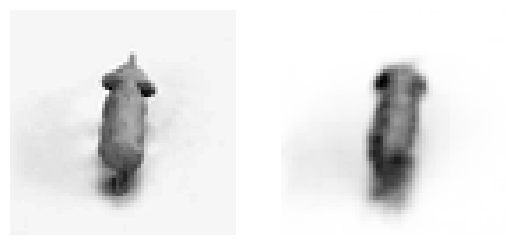

In [ ]:
original, rec = get_original_and_reconstructed_image(id=0)

fig, axes = plt.subplots(1,2)
axes[0].imshow(original.squeeze(), cmap="gray")
axes[0].axis("off")
axes[1].imshow(rec.squeeze(), cmap = "grey")
axes[1].axis("off")
plt.show()


In [ ]:
def latent_traversal(model, mod_type = "cl", z_core = None, z_style = None, latent_type="core", latent_idx=0, n_steps=5, mins = None, maxs = None):
    """
    Fix all latents except one and vary it across a range.
    latent_type: "core" or "style"
    latent_idx: which latent dimension to vary
    """
     # --- build the lookup key, e.g. "cl_core" or "pred_style" ---
    key = f"{mod_type}_{latent_type}"
    assert key in mins, f"Key '{key}' not found in mins. Available: {list(mins.keys())}"

    # --- extract scalar min/max for this specific dimension ---
    val_min = mins[key][latent_idx].item()
    val_max = maxs[key][latent_idx].item()

    # --- validate index bounds ---
    target = z_core if latent_type == "core" else z_style
    assert latent_idx < target.shape[0], (
        f"latent_idx={latent_idx} out of range for {latent_type} (dim={target.shape[0]})"
    )

    sweep = torch.linspace(val_min, val_max, n_steps, device=z_core.device)

    z_core = z_core.clone().unsqueeze(0)   # [1, 10]
    z_style = z_style.clone().unsqueeze(0) # [1, 10]

    reconstructions = []
    with torch.no_grad():
        for val in sweep:
            if latent_type == "core":
                z_core_modified = z_core.clone()
                z_core_modified[0, latent_idx] = val
                z = torch.cat([z_core_modified, z_style], dim=-1)
            else:
                z_style_modified = z_style.clone()
                z_style_modified[0, latent_idx] = val
                z = torch.cat([z_core, z_style_modified], dim=-1)

            rec = torch.sigmoid(model.model.decoder(z))
            reconstructions.append(rec.squeeze().cpu())

    # plot all reconstructions in a row
    fig, axes = plt.subplots(1, n_steps, figsize=(2 * n_steps, 2))
    for i, (rec, val) in enumerate(zip(reconstructions, sweep)):
        axes[i].imshow(rec, cmap="gray")
        axes[i].set_title(f"{val:.1f}", fontsize=8)
        axes[i].axis("off")
    plt.suptitle(f"Traversal of {latent_type} latent dim {latent_idx}", y=1.02)
    plt.tight_layout()
    plt.show()



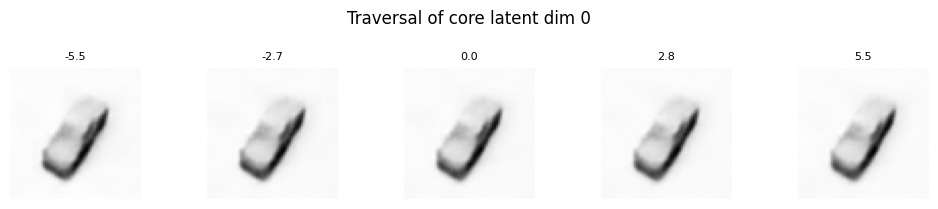

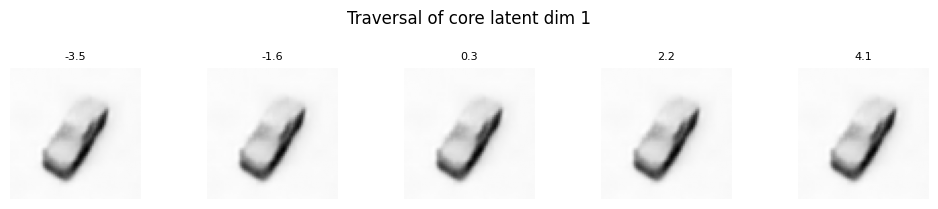

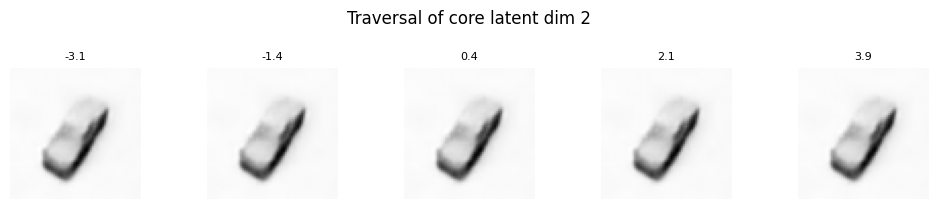

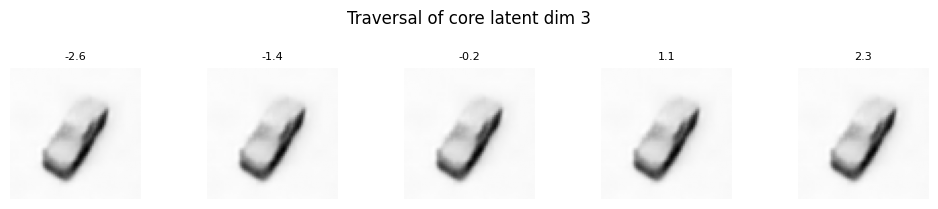

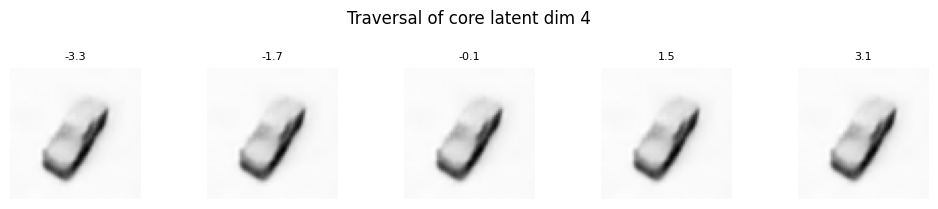

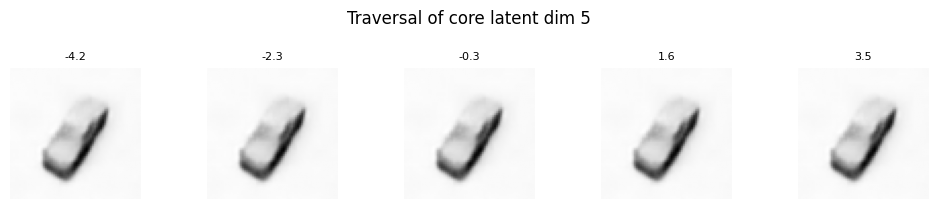

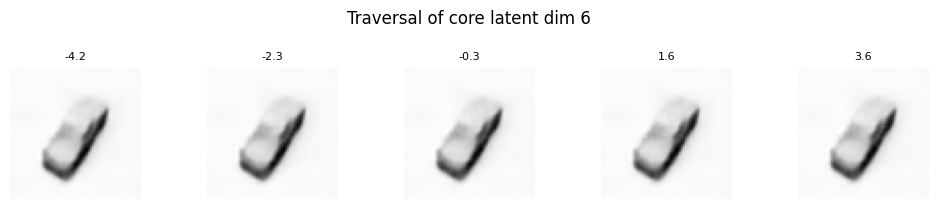

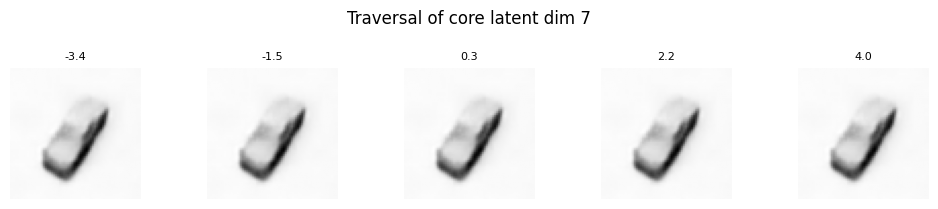

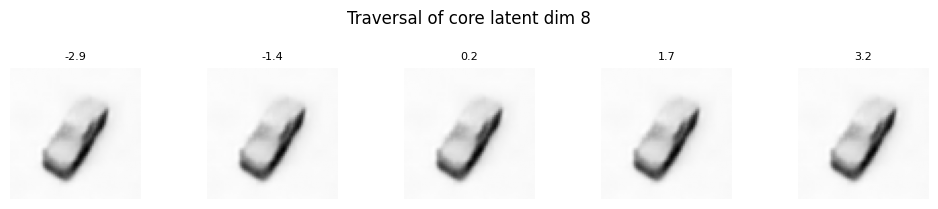

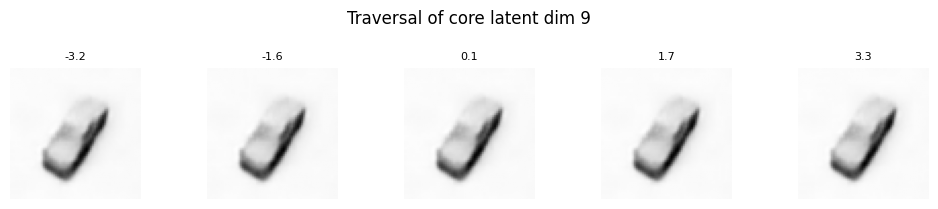

In [ ]:
#pick a sample and traverse each core latent dimension of CL model
i = 2
z_core = cl_z_core_f[i]
z_style = cl_z_style_f[i]

# traverse all core dimensions
for dim in range(z_core.shape[0]):
  latent_traversal(model = model, mod_type= "cl", z_core = z_core, z_style = z_style, latent_type="core", latent_idx=dim, mins = mins, maxs = maxs)


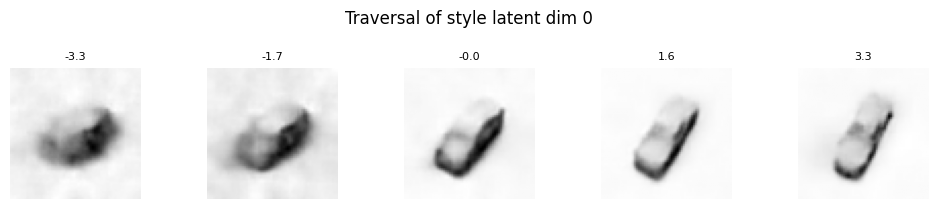

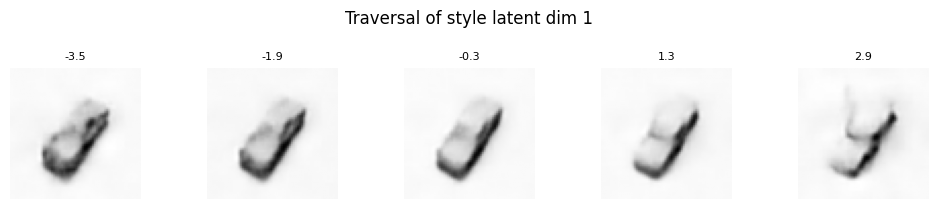

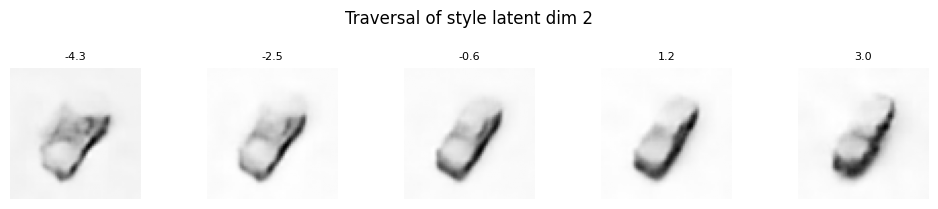

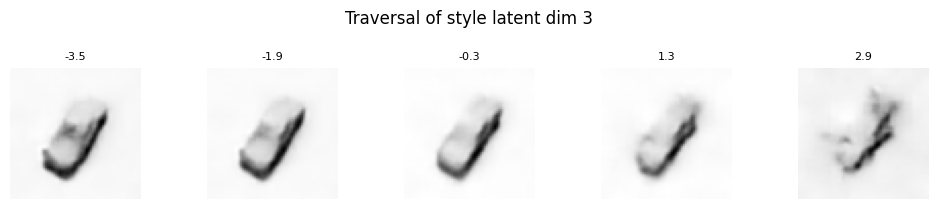

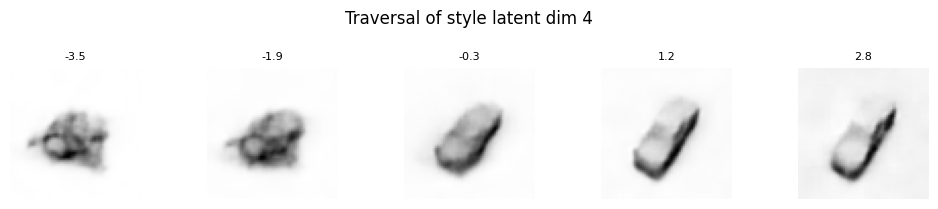

...

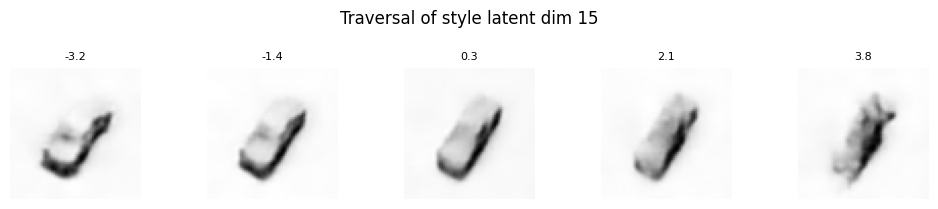

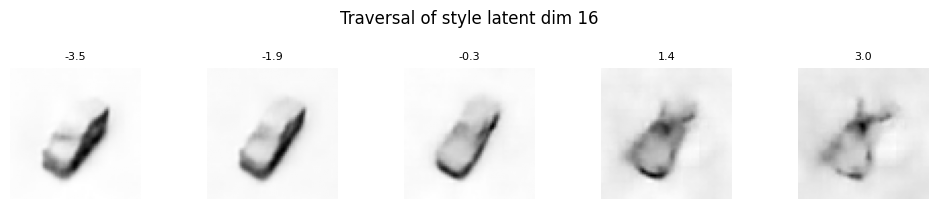

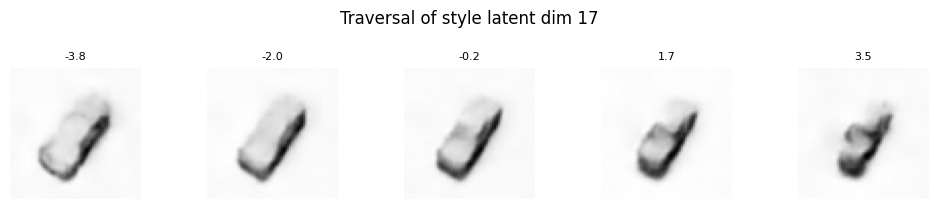

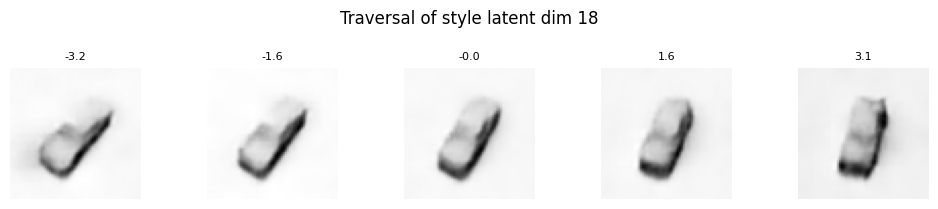

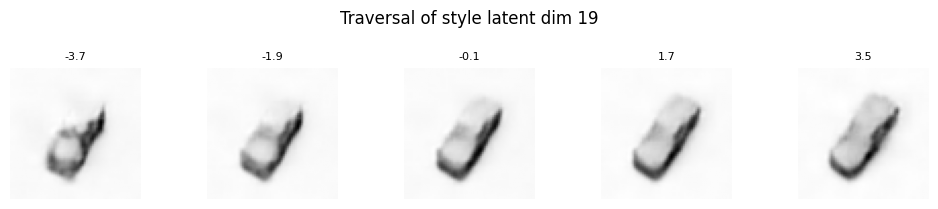

In [ ]:
# traverse all style dimensions
for dim in range(z_style.shape[0]):
    latent_traversal(model = model, mod_type= "cl", z_core = z_core, z_style = z_style, latent_type="style", latent_idx=dim, mins = mins, maxs = maxs)

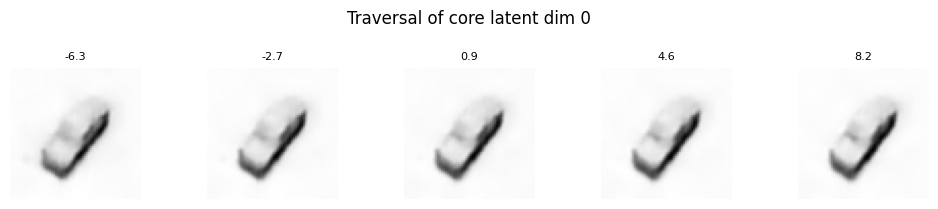

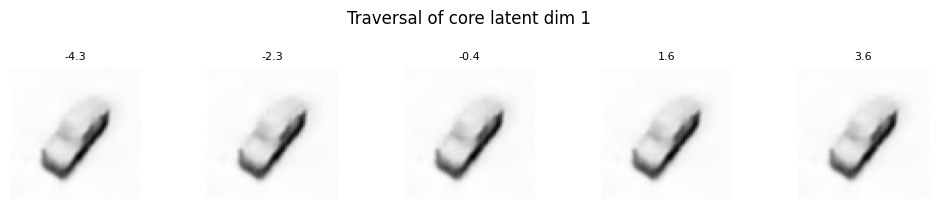

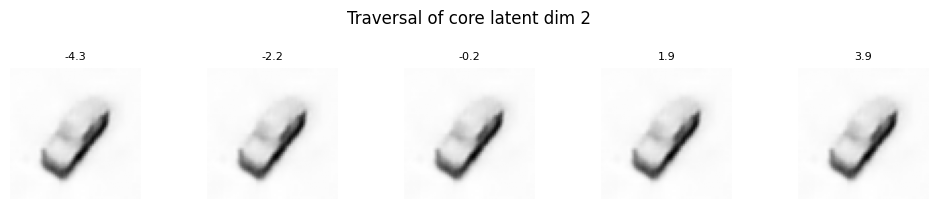

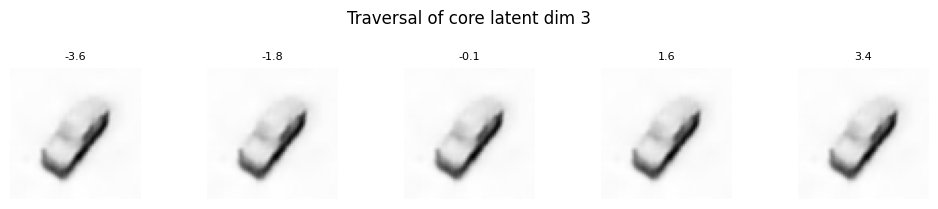

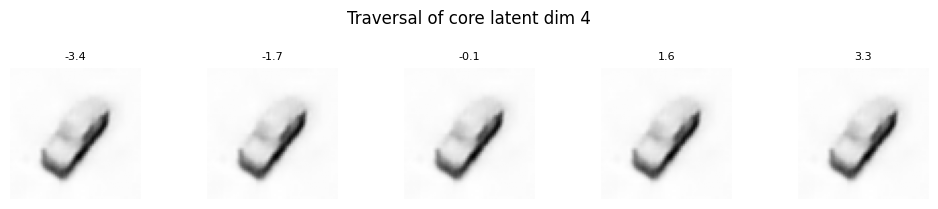

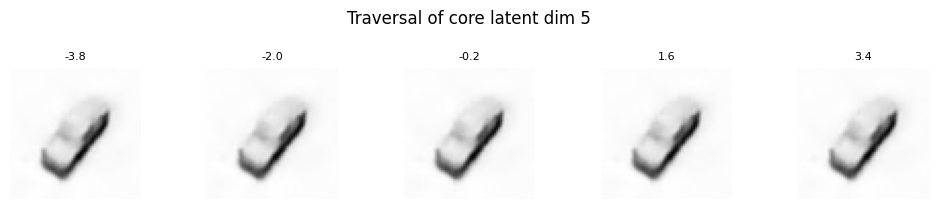

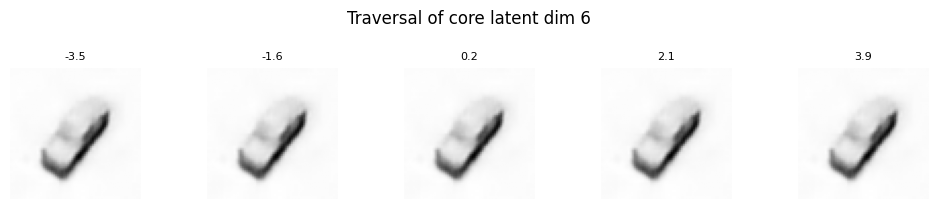

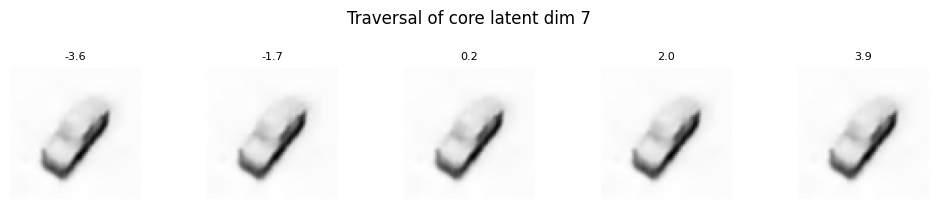

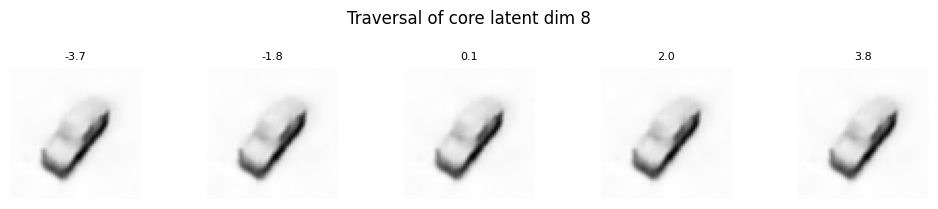

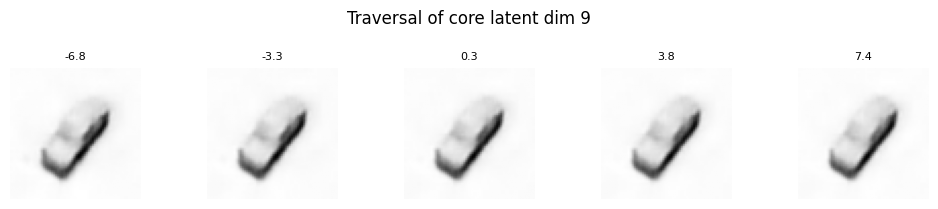

In [ ]:
#pick a sample and traverse each core latent dimension of PRED model
i = 2
z_core = pred_z_core_f[i]
z_style = pred_z_style_f[i]

# traverse all core dimensions
for dim in range(z_core.shape[0]):
  latent_traversal(model = model, mod_type= "pred", z_core = z_core, z_style = z_style, latent_type="core", latent_idx=dim, mins = mins, maxs = maxs)

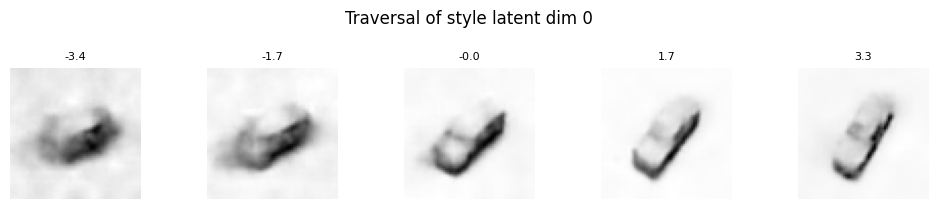

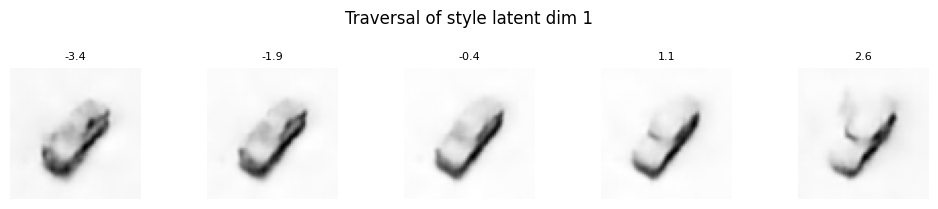

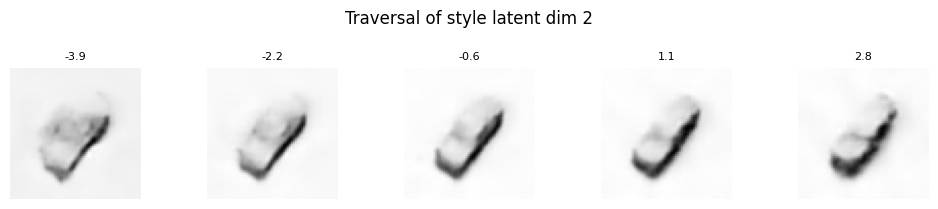

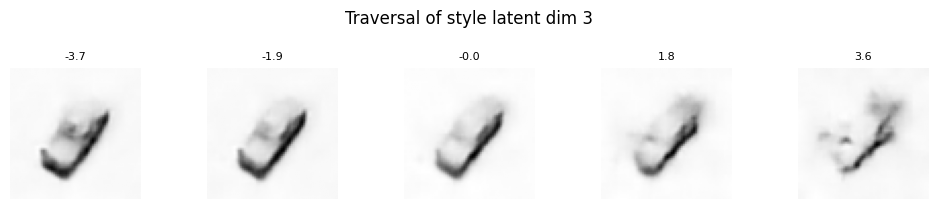

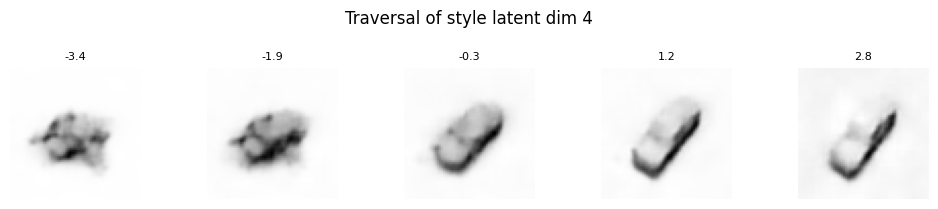

...

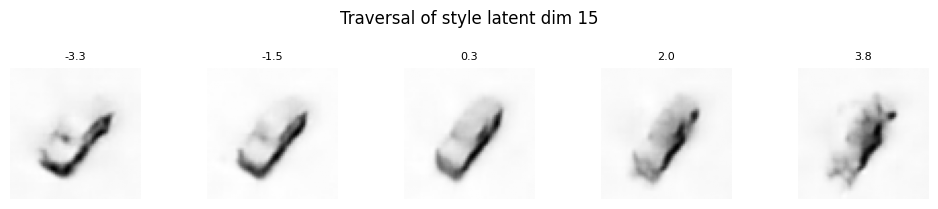

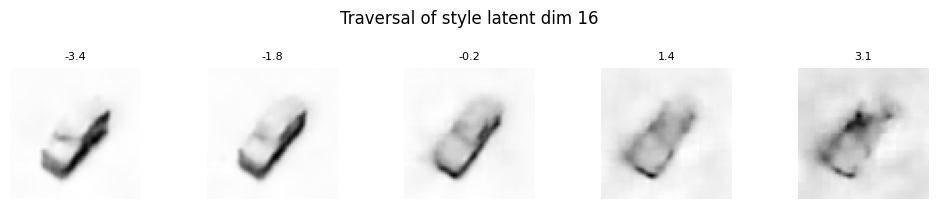

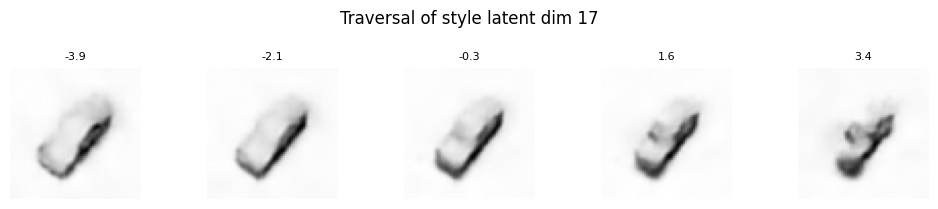

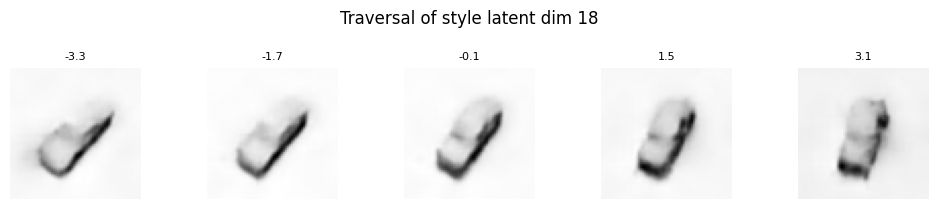

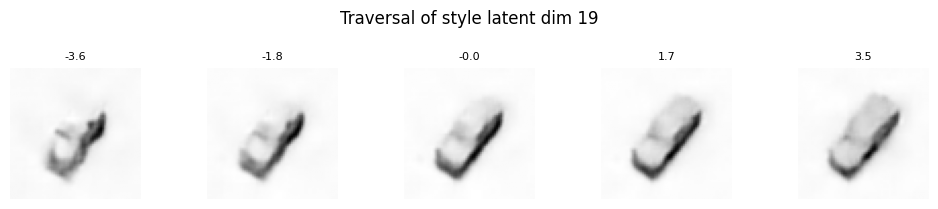

In [ ]:
#pick a sample and traverse each style latent dimension of PRED model
i = 2
z_core = pred_z_core_f[i]
z_style = pred_z_style_f[i]

# traverse all core dimensions
for dim in range(z_style.shape[0]):
  latent_traversal(model = model, mod_type= "pred", z_core = z_core, z_style = z_style, latent_type="style", latent_idx=dim, mins = mins, maxs = maxs)

In [ ]:
# get ground truth factors for all test samples
factors = np.array([data_module.test_dataset.get_factors(i)
                    for i in range(len(data_module.test_dataset))])
# factors[:, 0] = category, [:, 1] = instance, [:, 2] = elevation,
# [:, 3] = azimuth, [:, 4] = lighting

factor_names = ["category", "instance", "elevation", "azimuth", "lighting"]

# correlate each z_core dimension with each factor
import pandas as pd
z_core_np = cl_z_core_f.numpy()  # [n_samples, 10]

corr_matrix = np.zeros((10, 5))
for z_dim in range(10):
    for f_dim in range(5):
        corr_matrix[z_dim, f_dim] = np.corrcoef(z_core_np[:, z_dim], factors[:, f_dim])[0, 1]

df = pd.DataFrame(corr_matrix,
                  columns=factor_names,
                  index=[f"z_core_{i}" for i in range(10)])
print(df.round(3))

          category  instance  elevation  azimuth  lighting
z_core_0     0.002     0.167     -0.007    0.022    -0.779
z_core_1    -0.006     0.084     -0.024    0.000    -0.008
z_core_2     0.011    -0.102      0.005   -0.004     0.016
z_core_3     0.001     0.070     -0.005    0.005    -0.113
z_core_4    -0.032     0.031     -0.001    0.004     0.047
z_core_5     0.010    -0.106      0.002   -0.022     0.120
z_core_6     0.012    -0.071     -0.026   -0.011    -0.047
z_core_7     0.010    -0.018     -0.019    0.019    -0.122
z_core_8     0.003    -0.011     -0.021    0.007    -0.090
z_core_9     0.016    -0.434     -0.002    0.006    -0.736


In [ ]:
z_style_np = cl_z_style_f.numpy()  # [n_samples, 20]

corr_matrix_style = np.zeros((20, 5))
for z_dim in range(20):
    for f_dim in range(5):
        corr_matrix_style[z_dim, f_dim] = np.corrcoef(z_style_np[:, z_dim], factors[:, f_dim])[0, 1]

df_style = pd.DataFrame(corr_matrix_style,
                        columns=factor_names,
                        index=[f"z_style_{i}" for i in range(20)])
print(df_style.round(3))

            category  instance  elevation  azimuth  lighting
z_style_0     -0.128     0.029      0.147    0.051     0.288
z_style_1     -0.108     0.073      0.019    0.111    -0.044
z_style_2      0.148     0.010     -0.179   -0.059    -0.047
z_style_3      0.148    -0.070      0.188   -0.091     0.073
z_style_4     -0.020     0.026      0.127    0.088    -0.200
z_style_5     -0.088     0.023      0.004    0.081    -0.079
z_style_6     -0.190     0.018     -0.044    0.065    -0.044
z_style_7      0.069    -0.014      0.040    0.073    -0.004
z_style_8      0.085     0.079     -0.020    0.027    -0.113
z_style_9      0.033    -0.066      0.167   -0.049     0.134
z_style_10     0.152    -0.019      0.151    0.102     0.100
z_style_11    -0.354    -0.011     -0.201   -0.091    -0.163
z_style_12    -0.087    -0.025     -0.028    0.065    -0.172
z_style_13    -0.086    -0.035      0.182   -0.022    -0.072
z_style_14     0.079     0.049      0.069   -0.017     0.138
z_style_15    -0.411    

# Extract latent features

In [ ]:
#create a list of ids to track results
num_samples = len(data_module.test_dataset)
sample_ids = list(range(num_samples))

In [ ]:
labels = [data_module.test_dataset[i][1] for i in range(len(data_module.test_dataset))]
labels = np.array(labels)  # convert to NumPy array for plotting
print(labels.shape)

(4860, 4)


In [ ]:
pred_mean_core = []
pred_mean_style = []

batch_ids = []

model.eval()
with torch.no_grad():  # disables gradient computation for speed
    for batch_id, batch in enumerate(data_module.test_dataloader()):

        x, y = batch  # x: images, y: labels
        out = model.model.pred_vae(x)  # forward pass
        #embeddings are contained in the ['pred']['mean_core/style'] arguments

        #extract latent features of pred
        pred_mean_core.append(out['mean_core'])
        pred_mean_style.append(out['mean_style'])

        batch_ids.extend([batch_id] * x.shape[0])  # store batch index for each sample


In [ ]:
# concatenate latents across all test samples (stack together samples across different batches)
pred_mean_core_1 = torch.cat(pred_mean_core, dim=0)
pred_mean_style_1 = torch.cat(pred_mean_style, dim=0)

print("Pred mean_core shape:", pred_mean_core_1.shape)
print("Pred mean_style shape:", pred_mean_style_1.shape)

Pred mean_core shape: torch.Size([4860, 10])
Pred mean_style shape: torch.Size([4860, 20])


In [ ]:
# save latent features
torch.save({
    "pred_mean_core": pred_mean_core_1,
    "pred_mean_style": pred_mean_style_1,
    "labels": labels,
    "batch_ids": batch_ids
}, "correct_latent_features.pt")

#should be realoaded after

# load latent features file

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
correct_data = torch.load("/content/gdrive/MyDrive/CNAG/CLAP/correct_latent_features.pt", weights_only=False)

In [ ]:
print(correct_data.keys())

dict_keys(['pred_mean_core', 'pred_mean_style', 'labels', 'batch_ids'])


In [ ]:
pred_mean_core_f = correct_data["pred_mean_core"]
pred_mean_style_f = correct_data["pred_mean_style"]
labels = correct_data["labels"]
batch_ids = correct_data["batch_ids"]

# Latents' Analysis

## basic z statistics

In [ ]:

#PRED FEATURES STATISTICS
print("mean_core mean:\n", pred_mean_core_f.mean(dim=0))
print("\nmean_core std:\n", pred_mean_core_f.std(dim=0))
print("\n--------------------------")
print("mean_style mean\n:", pred_mean_style_f.mean(dim=0))
print("\nmean_style std:", pred_mean_style_f.std(dim=0))

mean_core mean:
 tensor([-1.9625e-01,  3.8809e-03,  7.2120e-04,  1.4026e-03,  3.3621e-03,
        -8.4433e-05, -3.8920e-03,  4.3842e-03,  2.8988e-03,  5.5053e-02])

mean_core std:
 tensor([3.0808, 0.0037, 0.0034, 0.0039, 0.0043, 0.0041, 0.0040, 0.0042, 0.0035,
        2.3635])

--------------------------
mean_style mean
: tensor([ 0.0131, -0.1808, -0.1120, -0.2246, -0.1209,  0.1840, -0.0913, -0.2514,
         0.0101, -0.0112,  0.0258,  0.1051,  0.1051,  0.1366, -0.1599, -0.1618,
        -0.0330,  0.0792,  0.1254,  0.0353])

mean_style std: tensor([1.1521, 0.8819, 0.8926, 0.8884, 1.0935, 0.9555, 0.8189, 0.9583, 0.8610,
        0.9069, 0.8856, 0.9607, 0.9121, 0.8844, 0.8617, 0.9184, 1.0015, 0.8801,
        0.9374, 0.8579])


Features with mean almost equal to 0 are centered, which is common for VAEs.

Features with high variance might encode more “informative” or changing characteristics (all latent features have quite significative sd).

Features with near-zero variance are probably unused.

Only first and last latents (of mean_core) are very significative, while all style latents seem significative

## PCA visualization

In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.layouts import gridplot

from bokeh.layouts import gridplot



labels_str = [str(lbl.tolist()) for lbl in labels]

# ----------- PCA on PRED core features ----------
mean_core_np = pred_mean_core_f.numpy()
pca_mean_core = PCA(n_components=2)
mean_core_2d = pca_mean_core.fit_transform(mean_core_np)

# ----------- PCA on PRED style features -----------
mean_style_np = pred_mean_style_f.numpy()
pca_mean_style = PCA(n_components=2)
mean_style_2d = pca_mean_style.fit_transform(mean_style_np)

#core source
output_notebook()
source_core = ColumnDataSource(data=dict(
    mean_core_x=mean_core_2d[:,0],
    mean_core_y=mean_core_2d[:,1],

    mean_style_x=mean_style_2d[:,0],
    mean_style_y=mean_style_2d[:,1],
    sample_id=sample_ids,
    label=labels_str
))

#core plot
core = figure(title="Core features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
core.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
core.circle('mean_core_x', 'mean_core_y', size=8, source=source_core, color="blue", selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

#style plot
output_notebook()
style = figure(title="Style features PCA", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
style.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
style.circle('mean_style_x', 'mean_style_y', size=8, source=source_core, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)


GlyphRenderer(id='p1100', ...)

In [ ]:
from bokeh.layouts import row
core.x_range = style.x_range
core.y_range = style.y_range
show(row(core, style))

## inspect latent features contribution to PCA axis

### core

In [ ]:
pca_mean_core.components_.shape
# each row is a principal component while each columns is a latent feature

#we can inspect the contribution of each latent feature in each PCA component
print("PC1 weights:", pca_mean_core.components_[0])
# the first feature is the most significant (positive) for PC1, followed by the last feature.
# other features are almost non-significant
print("PC2 weights:", pca_mean_core.components_[1])
#there are more feature quite significant for PC2 (in both positive and negative ways), only the last very is very significant

PC1 weights: [ 9.5886385e-01 -1.7866380e-04  9.8671080e-07  9.2572532e-07
  1.4888332e-04 -2.2560422e-05 -7.6494718e-05 -2.3545125e-04
  7.0219066e-05  2.8386611e-01]
PC2 weights: [-2.83866167e-01 -8.35721730e-05 -1.31962970e-05 -5.50026016e-06
  1.13489288e-04 -1.01612619e-04 -1.18506796e-04 -2.51472975e-05
  3.58072066e-05  9.58863914e-01]


In [ ]:
pc1_importance = np.abs(pca_mean_core.components_[0])
important_features = np.argsort(pc1_importance)[::-1]

print("Most important features for PC1:", important_features)

pc2_importance = np.abs(pca_mean_core.components_[1])
important_features_2 = np.argsort(pc2_importance)[::-1]

print("Most important features for PC2:", important_features_2)

Most important features for PC1: [0 9 7 1 4 6 8 5 2 3]
Most important features for PC2: [9 0 6 4 5 1 8 7 2 3]


In [ ]:
print(pca_mean_core.explained_variance_ratio_)
#the first component by itself can explain more than 60% of the variability of the whole dataset
#using the second component only allow to explain an additional 3%

[0.6543781  0.34561387]


### style

In [ ]:
pca_mean_style.components_.shape
# each row is a principal component while each columns is a latent feature

#we can inspect the contribution of each latent feature in each PCA component
print("PC1 weights:", pca_mean_style.components_[0])
# the first feature is the most significant (positive) for PC1, followed by the last feature.
# other features are almost non-significant
print("PC2 weights:", pca_mean_style.components_[1])
#there are more feature quite significant for PC2 (in both positive and negative ways), only the last very is very significant

PC1 weights: [-0.5870374   0.12246703 -0.06403241  0.05585968  0.6127902  -0.02632321
 -0.01601387  0.08773495 -0.05293916 -0.04226389  0.09900938 -0.08735196
  0.04430488 -0.01898482  0.03529311  0.04522569  0.45948404 -0.01451753
  0.10009321  0.00430234]
PC2 weights: [ 0.15892819  0.31565455 -0.10894272  0.07212673 -0.24301837 -0.39467347
 -0.0302037  -0.09039148  0.2799952  -0.21516386  0.36296225 -0.21614498
  0.25940087 -0.16584343  0.01450597  0.04724154  0.17978725  0.12786883
  0.42674583 -0.05432605]


In [ ]:
pc1_importance = np.abs(pca_mean_style.components_[0])
important_features = np.argsort(pc1_importance)[::-1]

print("Most important features for PC1:", important_features)

pc2_importance = np.abs(pca_mean_style.components_[1])
important_features_2 = np.argsort(pc2_importance)[::-1]

print("Most important features for PC2:", important_features_2)

Most important features for PC1: [ 4  0 16  1 18 10  7 11  2  3  8 15 12  9 14  5 13  6 17 19]
Most important features for PC2: [18  5 10  1  8 12  4 11  9 16 13  0 17  2  7  3 19 15  6 14]


In [ ]:
print(pca_mean_style.explained_variance_ratio_)
#these components don't explain much of the dataset variability (expected)

[0.11953703 0.09760804]


## UMAP

In [ ]:
!pip install umap-learn

In [ ]:
import umap

In [ ]:
#cl core
umap_core = umap.UMAP(n_components=2, random_state=42)
core_umap = umap_core.fit_transform(mean_core_np)

#cl style
umap_style = umap.UMAP(n_components=2, random_state=42)
style_umap = umap_style.fit_transform(mean_style_np)


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [ ]:
#Core features (UMAP)
source = ColumnDataSource(data=dict(
    core_x=core_umap[:,0],
    core_y=core_umap[:,1],
    style_x=style_umap[:,0],
    style_y=style_umap[:,1],
    sample_id=sample_ids,
    label=labels_str
))

#core plot
core = figure(title="Core features UMAP", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
core.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
core.circle('core_x', 'core_y', size=8, source=source, color="blue", selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

#style plot
output_notebook()
style = figure(title="Style features UMAP", tools="pan,wheel_zoom,box_zoom,lasso_select,reset")
style.add_tools(HoverTool(tooltips=[("Sample ID", "@sample_id"), ("Label", "@label")]))
style.circle('style_x', 'style_y', size=8, source=source, color="blue",selection_color = "red", alpha=0.6, nonselection_alpha = 0.1)

GlyphRenderer(id='p1308', ...)

In [ ]:
core.x_range = style.x_range
core.y_range = style.y_range
show(row(core, style))

## latent traversal

In [ ]:
# compute all latents' range of variation
tensors = {
    "core": pred_mean_core_f,
    "style": pred_mean_style_f,
}

mins = {}
maxs = {}
sds = {}
means = {}

for name, t in tensors.items():
    mins[name] = t.min(dim=0).values
    maxs[name] = t.max(dim=0).values
    sds[name] = t.std(dim=0)
    means[name] = t.mean(dim=0)


In [ ]:
#define a function to automatically change one latent's value in its (-3sigma, +3sigma) and plot all the reconstructions
def latent_traversal2(model, core = None, style = None, latent_type="core", latent_idx=0, n_steps=5, means = None, sds = None):
    """
    Fix all latents except one and vary it across a range.
    latent_type: "core" or "style"
    latent_idx: which latent dimension to vary
    """

     # --- build the lookup key, e.g. "core" or "style" ---
    key = f"{latent_type}"
    assert key in mins, f"Key '{key}' not found in mins. Available: {list(mins.keys())}"

    # --- extract scalar min/max for this specific dimension ---
    mean = means[key][latent_idx].item()
    sd = sds[key][latent_idx].item()

    # --- validate index bounds ---
    target = core if latent_type == "core" else style
    assert latent_idx < target.shape[0], (
        f"latent_idx={latent_idx} out of range for {latent_type} (dim={target.shape[0]})"
    )

    sweep = torch.linspace(mean-3*sd, mean+3*sd, n_steps, device=core.device)
    core = core.clone().unsqueeze(0)   # [1, 10]
    style = style.clone().unsqueeze(0) # [1, 10]

    reconstructions = []

    with torch.no_grad():
        for val in sweep:
            if latent_type == "core":
                core_modified = core.clone()
                core_modified[0, latent_idx] = val
                z = torch.cat([core_modified, style], dim=-1)

            else:
                style_modified = style.clone()
                style_modified[0, latent_idx] = val
                z = torch.cat([core, style_modified], dim=-1)

            rec = torch.sigmoid(model.model.decoder(z))

            reconstructions.append(rec.squeeze().cpu())

    # plot all reconstructions in a row
    fig, axes = plt.subplots(1, n_steps, figsize=(2 * n_steps, 2))

    for i, (rec, val) in enumerate(zip(reconstructions, sweep)):
        axes[i].imshow(rec, cmap="gray")
        axes[i].set_title(f"{val:.1f}", fontsize=8)
        axes[i].axis("off")

    plt.suptitle(f"Traversal of {latent_type} latent dim {latent_idx}", y=1.02)
    plt.tight_layout()
    plt.show()

    return reconstructions

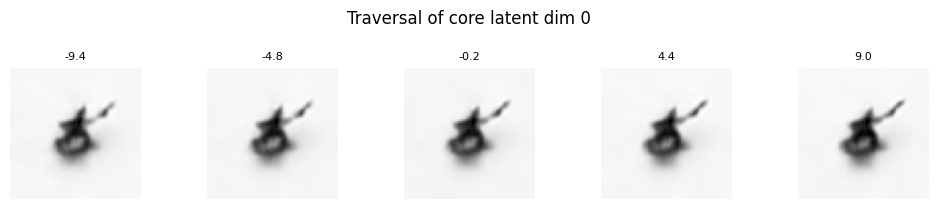

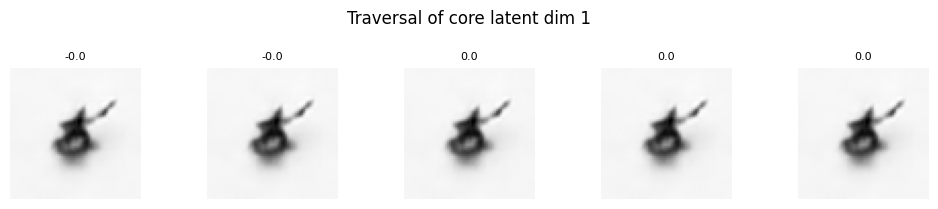

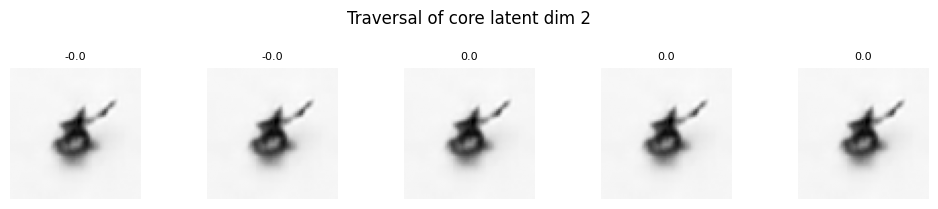

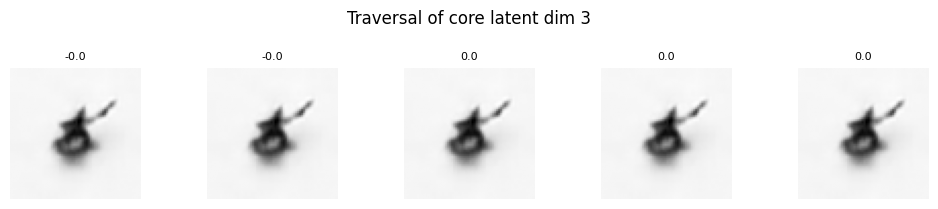

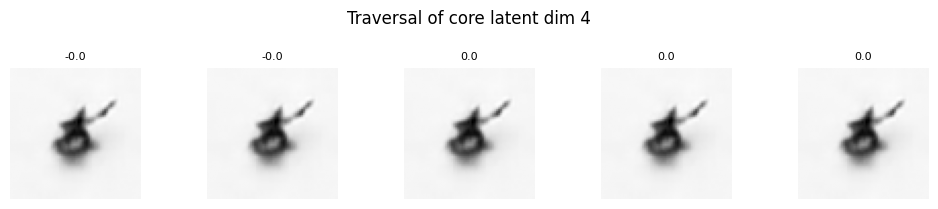

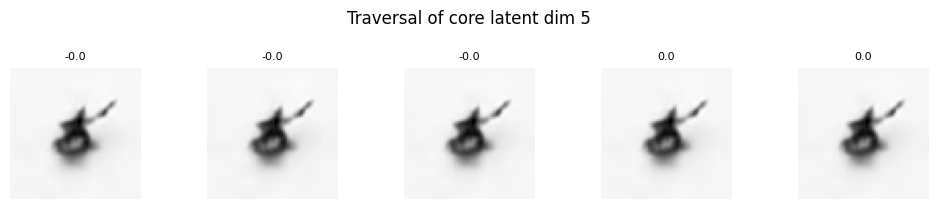

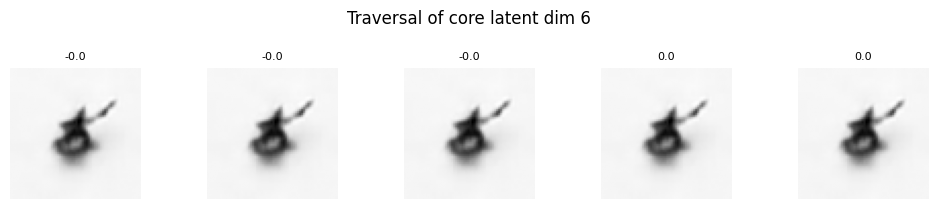

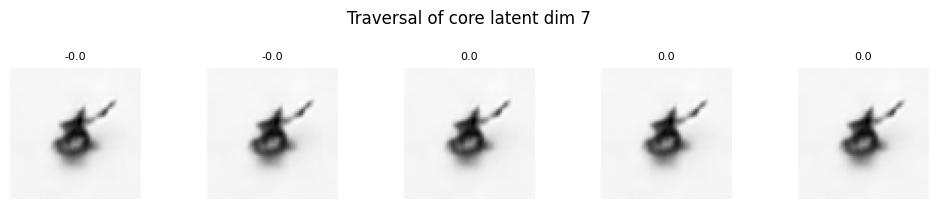

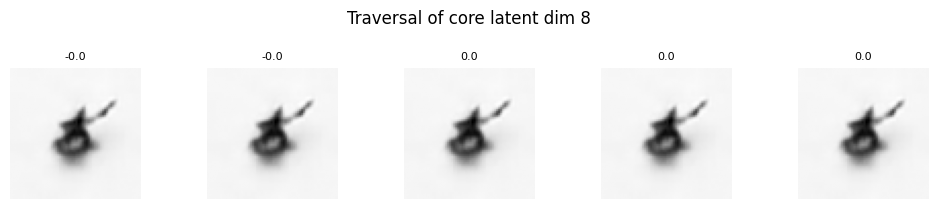

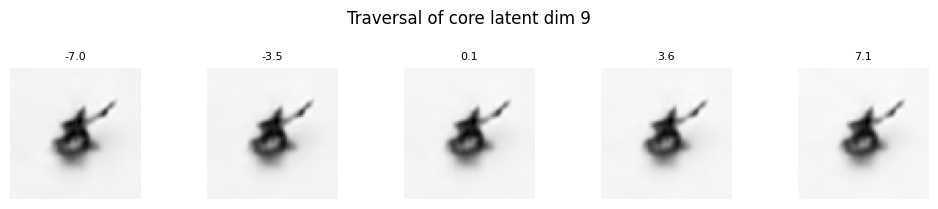

In [ ]:
#pick a sample and traverse each core latent dimension of CL model
i = 5
core = pred_mean_core_f[i]
style = pred_mean_style_f[i]

# traverse all core dimensions
for dim in range(core.shape[0]):
  latent_traversal2(model = model, core = core, style = style, latent_type="core", latent_idx=dim, means = means, sds = sds)


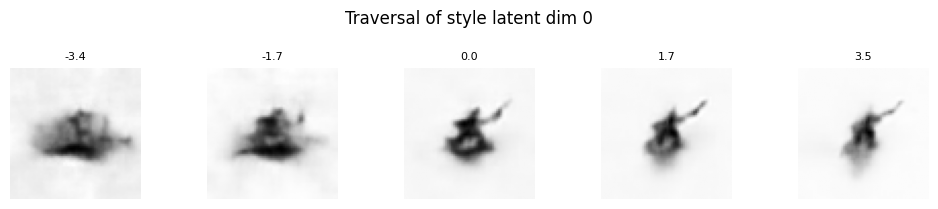

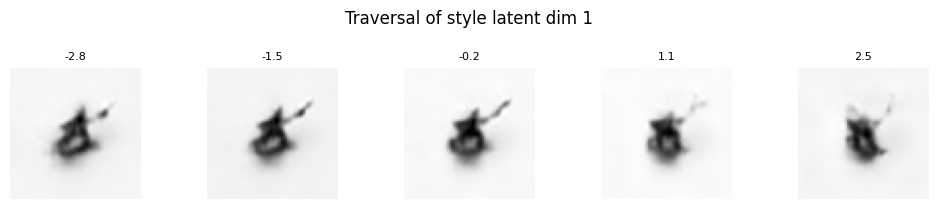

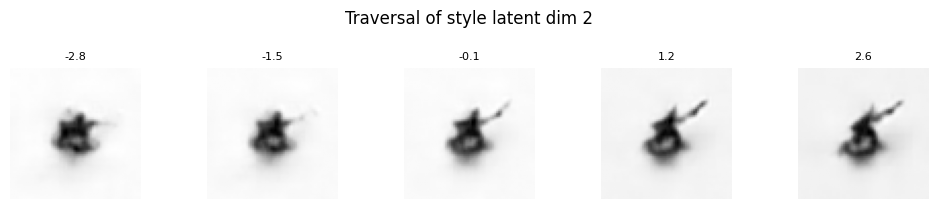

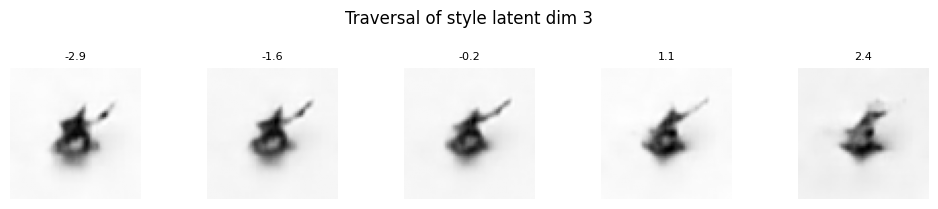

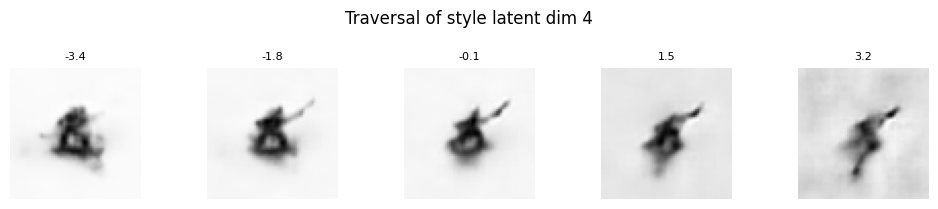

...

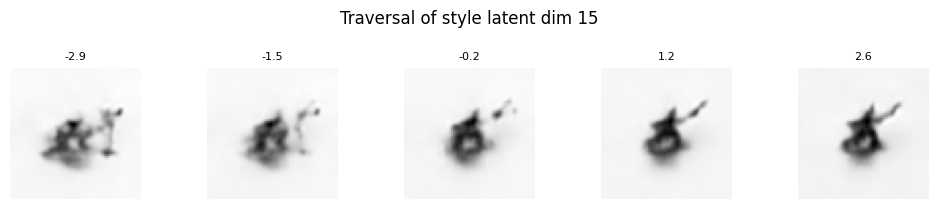

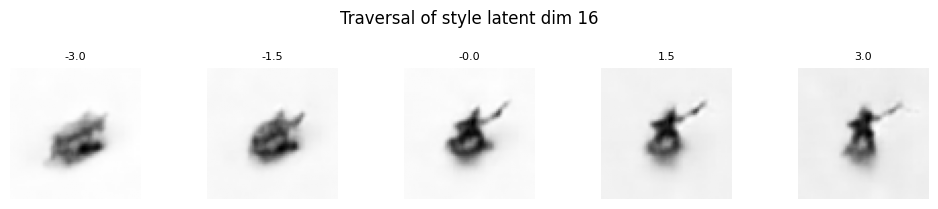

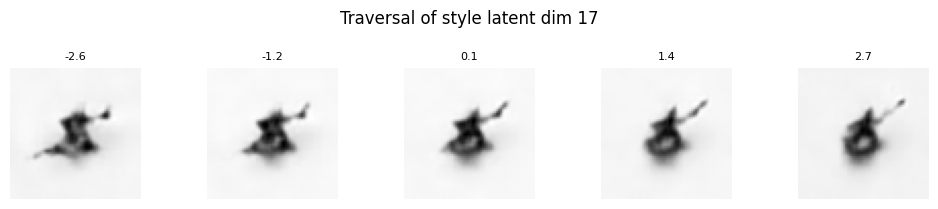

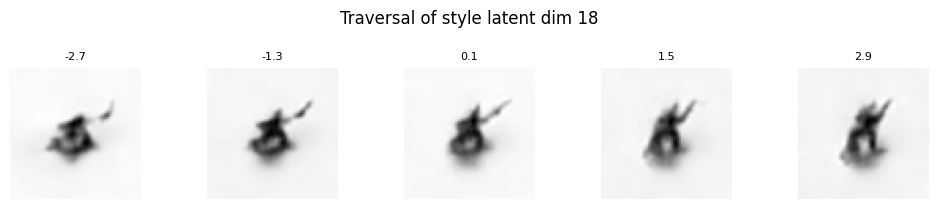

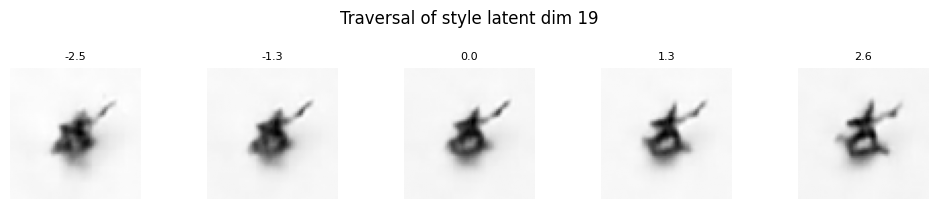

In [ ]:
#pick a sample and traverse each style latent dimension of CL model
i = 5
core = pred_mean_core_f[i]
style = pred_mean_style_f[i]

# traverse all core dimensions
for dim in range(style.shape[0]):
  latent_traversal2(model = model, core = core, style = style, latent_type="style", latent_idx=dim, means = means, sds = sds)


Why style changes the image more visibly:
- Style latents encode all the visual variation that is not predictive of the label y. Things like lighting angle, exact azimuth, fine texture — they vary freely across images and the model has 20 dimensions (z_style_dim=20) to capture all of this visual richness. So traversing style dimensions produces visible image changes because that's exactly their job: capturing diverse visual factors.

Why core changes the image less:
- Core latents (z_core_dim=10) are heavily constrained by two forces during training: the group sparsity regularization pushes most dimensions toward zero (many dimensions "die"), and the prediction loss forces the active dimensions to encode only what is necessary to predict y. Since y has only 4 binary labels in SmallNORB, only a few core dimensions need to be active. The rest collapse near zero and have no effect on reconstruction when traversed.

tensor([ 1.0741e+00,  2.4273e-03, -1.5439e-03, -6.1974e-04,  5.7935e-03,
        -1.5836e-03,  4.0438e-03, -6.2894e-04,  1.0394e-03,  4.8773e+00])
tensor([ 1.0741e+00,  2.0000e+00, -1.5439e-03, -6.1974e-04,  5.7935e-03,
        -1.5836e-03,  4.0438e-03, -6.2894e-04,  1.0394e-03,  4.8773e+00])


/tmp/ipykernel_62524/4281164529.py:42: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  final = np.abs(a().squeeze() - b().squeeze())


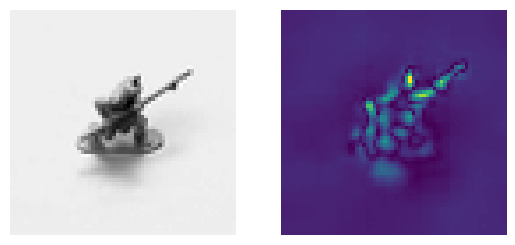

In [ ]:
#plot the difference between two reconstructed images with different value for a certain latent
def a():
  id = 5
  # original image
  original_img, label = data_module.test_dataset[id]

  # get the stored latents for that sample
  core = pred_mean_core_f[id].unsqueeze(0)   # shape [1, 10]
  core_1 = core.clone()
  print(core_1[0])
  style = pred_mean_style_f[id].unsqueeze(0) # shape [1, 10]

  # decode
  model.eval()
  with torch.no_grad():
      z = torch.cat([core_1, style], dim=-1)  # shape [1, 20]
      reconstruction = model.model.decoder(z)   # shape [1, 1, 64, 64]
      # reconstruction contains logits, apply sigmoid to get pixel values in [0,1]
      reconstruction = torch.sigmoid(reconstruction)
  return reconstruction

def b():#define a function that, given an id, return original and reconstructed image
  id = 5
  # original image
  original_img, label = data_module.test_dataset[id]

  # get the stored latents for that sample
  core = pred_mean_core_f[id].unsqueeze(0)   # shape [1, 10]
  core_1 = core.clone()
  core_1[0][1] = 2
  print(core_1[0])
  style = pred_mean_style_f[id].unsqueeze(0) # shape [1, 10]

  # decode
  model.eval()
  with torch.no_grad():
      z = torch.cat([core_1, style], dim=-1)  # shape [1, 20]
      reconstruction = model.model.decoder(z)   # shape [1, 1, 64, 64]
      # reconstruction contains logits, apply sigmoid to get pixel values in [0,1]
      reconstruction = torch.sigmoid(reconstruction)
  return reconstruction

final = np.abs(a().squeeze() - b().squeeze())

fig, axes = plt.subplots(1,2)
axes[0].imshow(original_img.squeeze(), cmap="gray")
axes[0].axis("off")
axes[1].imshow(final)
axes[1].axis("off")
plt.show()

## Correlation between latent and factors

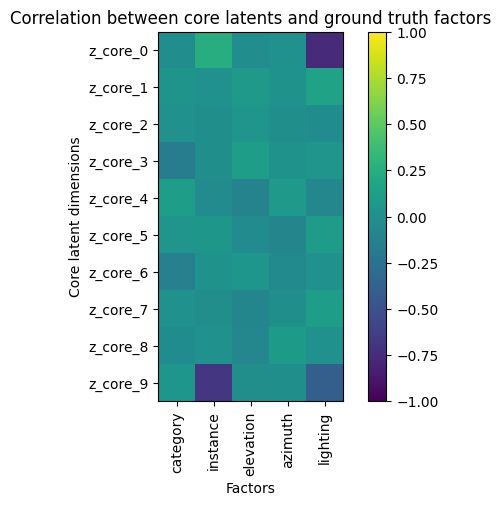

In [ ]:
# get ground truth factors for all test samples
factors = np.array([data_module.test_dataset.get_factors(i)
                    for i in range(len(data_module.test_dataset))])
# factors[:, 0] = category, [:, 1] = instance, [:, 2] = elevation,
# [:, 3] = azimuth, [:, 4] = lighting

factor_names = ["category", "instance", "elevation", "azimuth", "lighting"]

# correlate each z_core dimension with each factor
import pandas as pd
core_np = pred_mean_core_f.numpy()  # [n_samples, 10]

corr_matrix = np.zeros((10, 5))
for z_dim in range(10):
    for f_dim in range(5):
        corr_matrix[z_dim, f_dim] = np.corrcoef(core_np[:, z_dim], factors[:, f_dim])[0, 1]

df = pd.DataFrame(corr_matrix,
                  columns=factor_names,
                  index=[f"z_core_{i}" for i in range(10)])

plt.imshow(df.round(3), vmin=-1, vmax=1)
plt.title("Correlation between core latents and ground truth factors")
plt.xticks(ticks=np.arange(len(factor_names)), labels=factor_names, rotation=90)
plt.yticks(ticks=np.arange(10), labels=df.index)
plt.xlabel("Factors")
plt.ylabel("Core latent dimensions")
plt.colorbar()
plt.show()

In [ ]:
df

,category,instance,elevation,azimuth,lighting
z_core_0,-0.020557,0.244966,-0.019528,0.015026,-0.760907
z_core_1,0.037940,0.014732,0.076036,0.019839,0.154661
z_core_2,0.010896,-0.006941,0.046170,-0.001700,-0.025436
z_core_3,-0.162495,-0.001747,0.112104,0.028890,0.043561
z_core_4,0.111914,-0.035343,-0.105800,0.071301,-0.072748
z_core_5,0.040184,0.058699,-0.036797,-0.088016,0.105103
z_core_6,-0.129300,0.016425,0.047867,-0.039572,0.014003
z_core_7,0.009032,-0.009834,-0.084106,-0.001331,0.112954
z_core_8,-0.025115,0.012780,-0.072293,0.088330,0.011334
z_core_9,0.047856,-0.681538,-0.008721,-0.006303,-0.394894


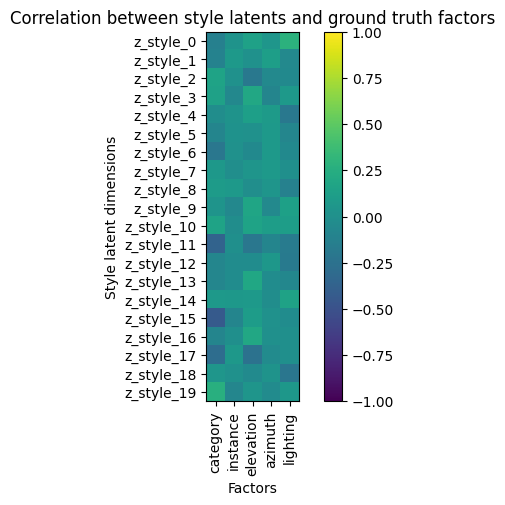

In [ ]:
style_np = pred_mean_style_f.numpy()  # [n_samples, 20]

corr_matrix_style = np.zeros((20, 5))
for z_dim in range(20):
    for f_dim in range(5):
        corr_matrix_style[z_dim, f_dim] = np.corrcoef(style_np[:, z_dim], factors[:, f_dim])[0, 1]

df_style = pd.DataFrame(corr_matrix_style,
                        columns=factor_names,
                        index=[f"z_style_{i}" for i in range(20)])
plt.imshow(df_style.round(3), vmin=-1, vmax=1)
plt.title("Correlation between style latents and ground truth factors")
plt.xticks(ticks=np.arange(len(factor_names)), labels=factor_names, rotation=90)
plt.yticks(ticks=np.arange(20), labels=df_style.index)
plt.xlabel("Factors")
plt.ylabel("Style latent dimensions")
plt.colorbar()
plt.show()

The correlation analysis confirms the disentanglement learned by CLAP. The core latent dimensions correlate primarily with the ground truth factors that define the supervision signal — instance type and lighting — which are exactly the factors used to construct the binary labels. The style latent dimensions show weaker and more distributed correlations across all factors, including purely visual ones like elevation and azimuth that carry no label information. This validates that the model successfully separated label-relevant information into the core space and pushed label-irrelevant visual variation into the style space.

## mutual information between latent and factors

Text(0.5, 1.0, 'Mutual Information: z_core vs ground truth factors')

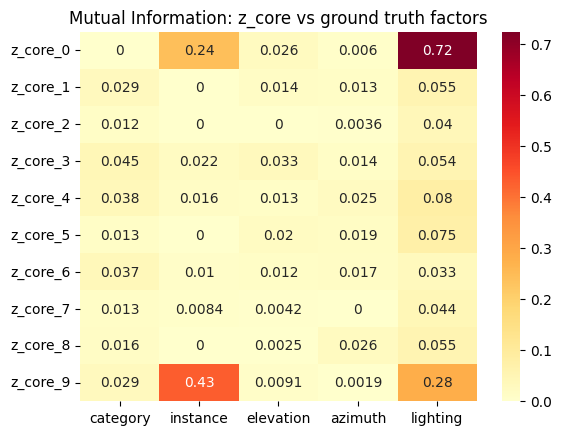

In [ ]:
from sklearn.feature_selection import mutual_info_regression
import seaborn as sns # Import seaborn

mi_matrix = np.zeros((10, 5))
for f_dim in range(5):
    mi = mutual_info_regression(core_np, factors[:, f_dim])
    mi_matrix[:, f_dim] = mi

df_mi = pd.DataFrame(mi_matrix,
                     columns=factor_names,
                     index=[f"z_core_{i}" for i in range(10)])
sns.heatmap(df_mi, annot=True, cmap="YlOrRd")
plt.title("Mutual Information: z_core vs ground truth factors")

Text(0.5, 1.0, 'Mutual Information: z_style vs ground truth factors')

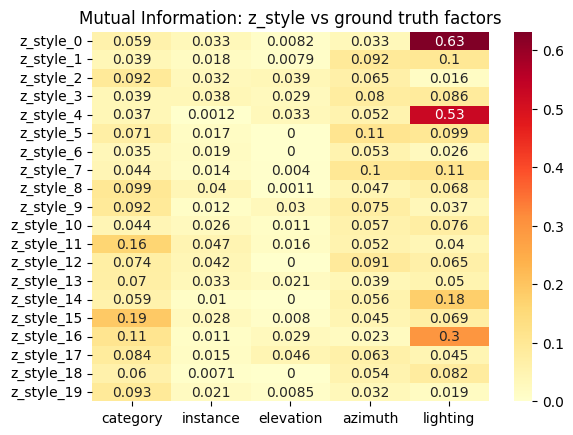

In [ ]:
from sklearn.feature_selection import mutual_info_regression

mi_matrix = np.zeros((20, 5))
for f_dim in range(5):
    mi = mutual_info_regression(style_np, factors[:, f_dim])
    mi_matrix[:, f_dim] = mi

df_mi = pd.DataFrame(mi_matrix,
                     columns=factor_names,
                     index=[f"z_style_{i}" for i in range(20)])
sns.heatmap(df_mi, annot=True, cmap="YlOrRd")
plt.title("Mutual Information: z_style vs ground truth factors")

## weight matrix of the classifier

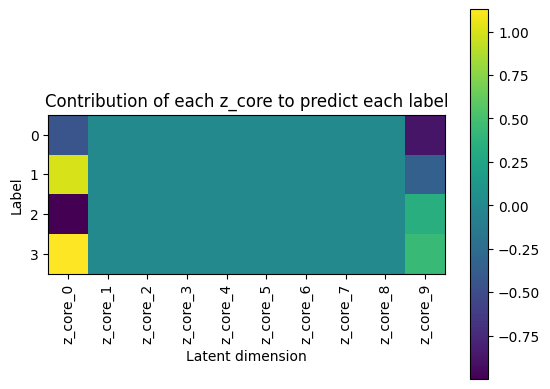

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(model.model.pred_vae.predictor.state_dict()['fc.weight'].numpy())
plt.xticks(ticks=np.arange(10), labels=[f"z_core_{i}" for i in range(10)], rotation = 90)
plt.xlabel("Latent dimension")
plt.ylabel("Label")
plt.title("Contribution of each z_core to predict each label")
plt.colorbar()

In [ ]:
model.model.pred_vae.predictor.state_dict()['fc.weight']

tensor([[-4.4008e-01, -6.5907e-05,  1.1169e-04, -1.4822e-04, -2.8403e-05,
          9.4737e-05, -2.1478e-04,  1.2261e-04, -1.0060e-04, -8.8203e-01],
        [ 9.9842e-01, -8.5616e-05,  4.5739e-05, -3.5346e-05, -1.4465e-04,
         -6.0280e-05,  1.4201e-04,  5.9420e-05,  2.0802e-04, -3.4452e-01],
        [-9.9842e-01,  8.5616e-05, -4.5739e-05,  3.5346e-05,  1.4465e-04,
          6.0280e-05, -1.4201e-04, -5.9420e-05, -2.0802e-04,  3.4452e-01],
        [ 1.1273e+00, -5.4559e-05,  2.5054e-05, -2.3038e-05, -3.0659e-05,
          9.3754e-05,  9.2272e-05, -2.8540e-05,  1.6219e-04,  4.4187e-01]])

The classifier weight matrix reveals which core dimensions the model selected as predictive features. Combined with the traversal visualizations and the factor correlation analysis, this allows us to assign a semantic meaning to each active core dimension. Dimensions with near-zero weights across all labels correspond to the dimensions killed by group sparsity — they are inactive and contribute nothing to prediction. The surviving dimensions with large weights are the discovered concepts, and by cross-referencing with the correlation matrix we can identify which ground truth factor each concept corresponds to

We can understand that only z_core_0 and z_core_9 are active (their weights are different from zero) --> group sparsity worked as intended: out of 10 core dimensions, only 2 survive

z_core_0:

weight matrix: used by all 4 labels (weights: -0.44, +0.99, -0.99, +1.13)
correlation matrix: strongest correlation with lighting (-0.76), very low with everything else
interpretation: z_core_0 encodes lighting/background

z_core_9:

weight matrix: also used by all 4 labels (weights: -0.88, -0.34, +0.34, +0.44)
correlation matrix: strongest correlation with instance (-0.68), secondary with lighting (-0.39)
interpretation: z_core_9 encodes instance/object type

The group sparsity regularization successfully reduced the effective dimensionality of the core space from 10 to 2. The two surviving dimensions, identified by their large classifier weights, correspond to the ground truth factors used to construct the supervision signal: z_core_0 encodes background lighting (correlation -0.76 with lighting factor) and z_core_9 encodes object instance/type (correlation -0.68 with instance factor). The remaining 8 dimensions collapsed to near-zero and contribute nothing to prediction or reconstruction. This demonstrates that CLAP automatically discovered the minimal set of concepts necessary to explain the labels, without being told how many concepts to look for.

## change core and see predicted label

In [ ]:
# function that given an input image and a core latent varies the latent's value and return the predicted classification
def traversal_with_prediction(model, x_single, core, style, dim, values):
  values = torch.linspace(means["core"][dim]-3*sds["core"][dim], means["core"][dim]+3*sds["core"][dim], steps=10)
  model.eval()
  with torch.no_grad():
      for val in values:
          # modify only the target dimension
          z_core_modified = core.clone()
          z_core_modified[dim] = val

          # get new prediction from the classifier
          z_core_modified_batched = z_core_modified.unsqueeze(0)  # add batch dim
          y_pred = model.model.pred_vae.predictor(z_core_modified_batched)
          y_pred_binary = (torch.sigmoid(y_pred) >= 0.5).int()

          # reconstruct image
          z = torch.cat([z_core_modified_batched, style.unsqueeze(0)], dim=-1)
          recon = model.model.pred_vae.decoder(z)

          print(f"z_core_{dim} = {val:.2f} → label: {y_pred_binary.squeeze().tolist()}")


In [ ]:

# test it
i = 5
core = pred_mean_core_f[i]
style = pred_mean_style_f[i]

 # traverse z_core_0
traversal_with_prediction(model, None, core, style, dim=0, values=values)

 # traverse z_core_9
traversal_with_prediction(model, None, core, style, dim=9, values=values)
#by changing latent 0 and 9 the predicted label changes


z_core_0 = -9.44 → label: [0, 0, 1, 0]
z_core_0 = -7.38 → label: [0, 0, 1, 0]
z_core_0 = -5.33 → label: [0, 0, 1, 0]
z_core_0 = -3.28 → label: [0, 0, 1, 0]
z_core_0 = -1.22 → label: [0, 0, 1, 1]
z_core_0 = 0.83 → label: [0, 0, 1, 1]
z_core_0 = 2.88 → label: [0, 0, 1, 1]
z_core_0 = 4.94 → label: [0, 1, 0, 1]
z_core_0 = 6.99 → label: [0, 1, 0, 1]
z_core_0 = 9.05 → label: [0, 1, 0, 1]
z_core_9 = -7.04 → label: [1, 1, 0, 0]
z_core_9 = -5.46 → label: [1, 1, 0, 0]
z_core_9 = -3.88 → label: [1, 1, 0, 1]
z_core_9 = -2.31 → label: [0, 0, 1, 1]
z_core_9 = -0.73 → label: [0, 0, 1, 1]
z_core_9 = 0.84 → label: [0, 0, 1, 1]
z_core_9 = 2.42 → label: [0, 0, 1, 1]
z_core_9 = 3.99 → label: [0, 0, 1, 1]
z_core_9 = 5.57 → label: [0, 0, 1, 1]
z_core_9 = 7.15 → label: [0, 0, 1, 1]


In [ ]:
 # traverse z_core_1
traversal_with_prediction(model, None, core, style, dim=1, values=values)

 # traverse z_core_3
traversal_with_prediction(model, None, core, style, dim=3, values=values)

 # traverse z_core_5
traversal_with_prediction(model, None, core, style, dim=5, values=values)

 # traverse z_core_6
traversal_with_prediction(model, None, core, style, dim=6, values=values)

#if i change other latents value the predicted label doesn't change

z_core_1 = -0.01 → label: [0, 0, 1, 1]
z_core_1 = -0.00 → label: [0, 0, 1, 1]
z_core_1 = -0.00 → label: [0, 0, 1, 1]
z_core_1 = 0.00 → label: [0, 0, 1, 1]
z_core_1 = 0.00 → label: [0, 0, 1, 1]
z_core_1 = 0.01 → label: [0, 0, 1, 1]
z_core_1 = 0.01 → label: [0, 0, 1, 1]
z_core_1 = 0.01 → label: [0, 0, 1, 1]
z_core_1 = 0.01 → label: [0, 0, 1, 1]
z_core_1 = 0.02 → label: [0, 0, 1, 1]
z_core_3 = -0.01 → label: [0, 0, 1, 1]
z_core_3 = -0.01 → label: [0, 0, 1, 1]
z_core_3 = -0.01 → label: [0, 0, 1, 1]
z_core_3 = -0.00 → label: [0, 0, 1, 1]
z_core_3 = 0.00 → label: [0, 0, 1, 1]
z_core_3 = 0.00 → label: [0, 0, 1, 1]
z_core_3 = 0.01 → label: [0, 0, 1, 1]
z_core_3 = 0.01 → label: [0, 0, 1, 1]
z_core_3 = 0.01 → label: [0, 0, 1, 1]
z_core_3 = 0.01 → label: [0, 0, 1, 1]
z_core_5 = -0.01 → label: [0, 0, 1, 1]
z_core_5 = -0.01 → label: [0, 0, 1, 1]
z_core_5 = -0.01 → label: [0, 0, 1, 1]
z_core_5 = -0.00 → label: [0, 0, 1, 1]
z_core_5 = -0.00 → label: [0, 0, 1, 1]
z_core_5 = 0.00 → label: [0, 0, 1, 1]


## latent traversal + prediction

In [ ]:
def rec_and_pred_grid(model, core=None, style=None, latent_type="core", latent_idx=0, n_steps=5, means=None, sds=None):
    key = f"{latent_type}"
    mean = means[key][latent_idx].item()
    sd = sds[key][latent_idx].item()

    sweep = torch.linspace(mean - 3*sd, mean + 3*sd, n_steps, device=core.device)
    core = core.clone().unsqueeze(0)
    style = style.clone().unsqueeze(0)

    # --- collect all reconstructions and predictions first ---
    reconstructions = []
    predictions = []

    with torch.no_grad():
        for val in sweep:
            if latent_type == "core":
                core_modified = core.clone()
                core_modified[0, latent_idx] = val
                pred = model.model.pred_vae.predictor(core_modified)
                z = torch.cat([core_modified, style], dim=-1)
            else:
                style_modified = style.clone()
                style_modified[0, latent_idx] = val
                pred = model.model.pred_vae.predictor(core)
                z = torch.cat([core, style_modified], dim=-1)

            pred_binary = (torch.sigmoid(pred) >= 0.5).int()
            rec = torch.sigmoid(model.model.pred_vae.decoder(z))

            reconstructions.append(rec.squeeze().cpu())
            predictions.append(pred_binary.squeeze().tolist())
    # --- plot grid ---
    fig, axes = plt.subplots(1, n_steps, figsize=(2.5 * n_steps, 3.5))

    for i, (rec, pred, val) in enumerate(zip(reconstructions, predictions, sweep)):
        ax = axes[i]
        ax.imshow(rec.numpy(), cmap="gray")
        ax.set_title(f"z={val:.2f}", fontsize=8)

        # format prediction as named labels
        ax.set_xlabel(predictions[i], fontsize=7)
        ax.set_xticks([])
        ax.set_yticks([])

    fig.suptitle(f"Traversal of {latent_type} dim {latent_idx}", fontsize=11, y=1.02)
    plt.tight_layout()
    plt.show()


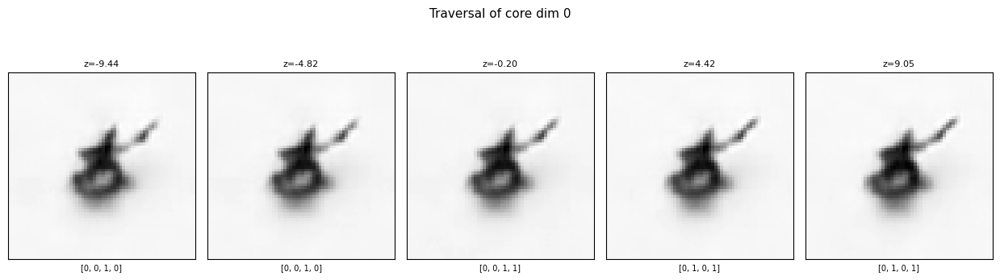

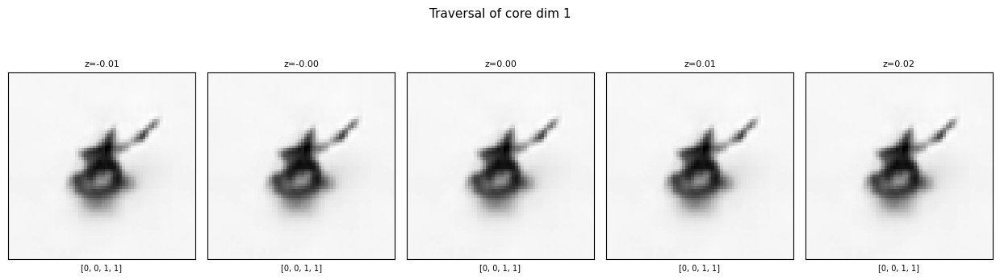

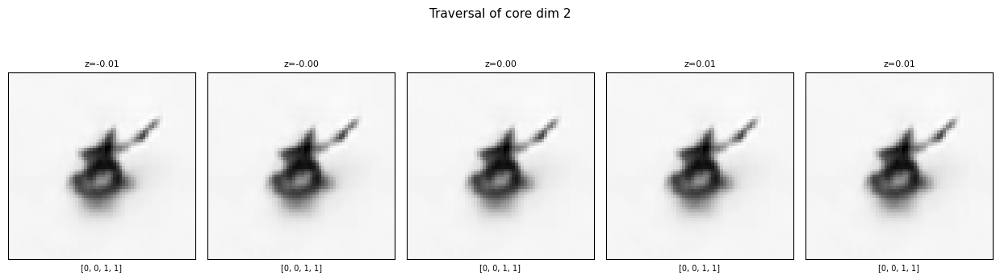

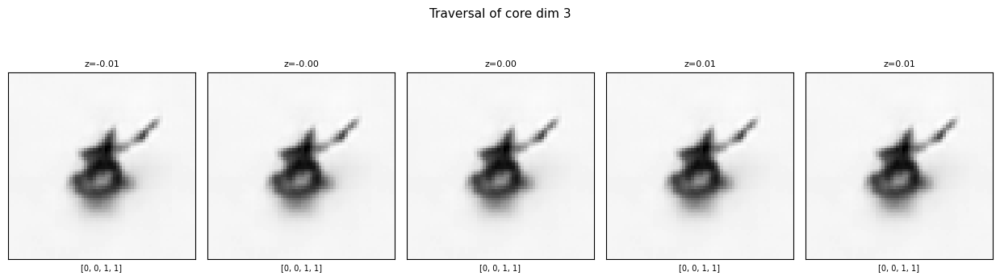

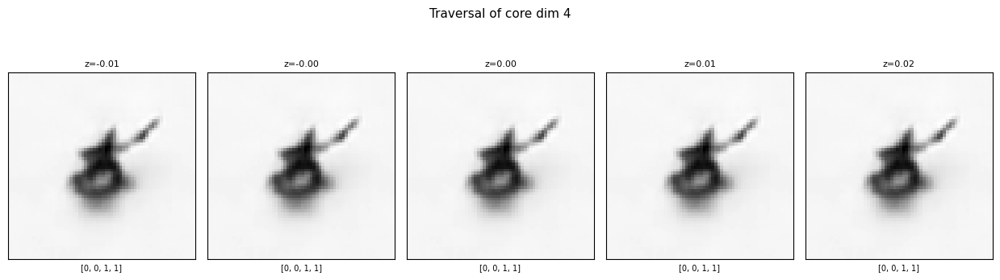

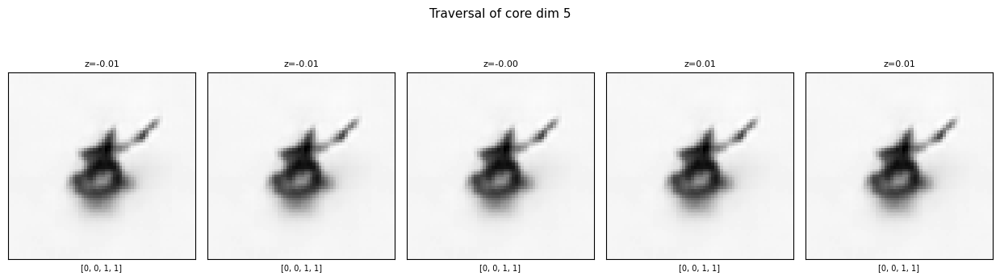

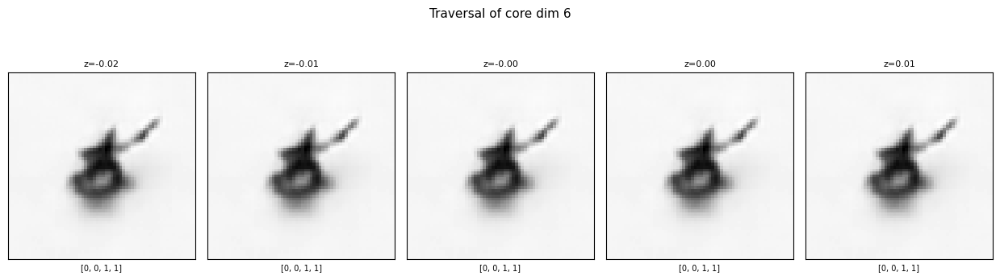

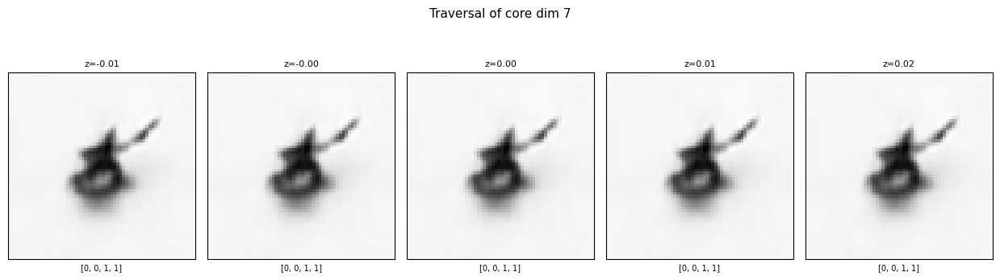

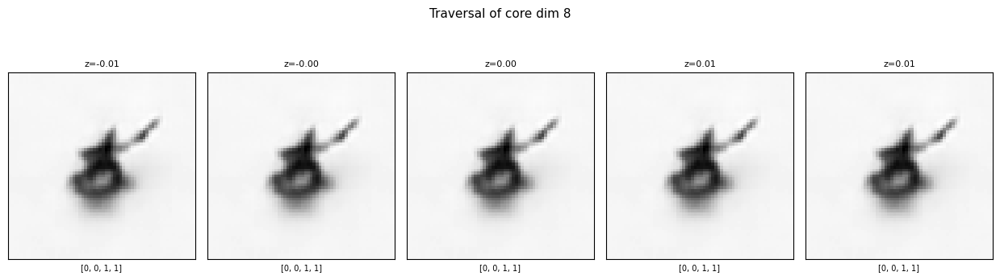

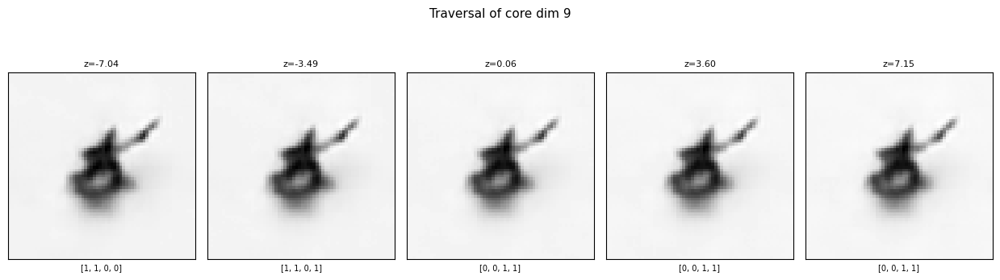

In [ ]:
# --- usage: traverse all active dimensions ---
i = 5
core = pred_mean_core_f[i]
style = pred_mean_style_f[i]

# only traverse the two active dimensions
for dim in range(0,10):
    rec_and_pred_grid(model=model, core=core, style=style,
                      latent_type="core", latent_idx=dim,
                      n_steps=5, means=means, sds=sds)

In [ ]:
def rec_and_pred_full_grid(model, core, style, latent_type="core", n_steps=10, means=None, sds=None):

    target = core if latent_type == "core" else style
    n_dims = target.shape[0]

    fig, axes = plt.subplots(n_dims, n_steps, figsize=(2 * n_steps, 2 * n_dims))

    for dim in range(n_dims):
        mean = means[latent_type][dim].item()
        sd = sds[latent_type][dim].item()
        sweep = torch.linspace(mean - 3*sd, mean + 3*sd, n_steps, device=core.device)

        core_in = core.clone().unsqueeze(0)
        style_in = style.clone().unsqueeze(0)

        with torch.no_grad():
            for step, val in enumerate(sweep):
                ax = axes[dim, step]

                if latent_type == "core":
                    core_modified = core_in.clone()
                    core_modified[0, dim] = val
                    pred = model.model.pred_vae.predictor(core_modified)
                    z = torch.cat([core_modified, style_in], dim=-1)
                else:
                    style_modified = style_in.clone()
                    style_modified[0, dim] = val
                    pred = model.model.pred_vae.predictor(core_in)
                    z = torch.cat([core_in, style_modified], dim=-1)

                pred_binary = (torch.sigmoid(pred) >= 0.5).int().squeeze().tolist()
                rec = torch.sigmoid(model.model.pred_vae.decoder(z)).squeeze().cpu()

                ax.imshow(rec.numpy(), cmap="gray")
                ax.set_xticks([])
                ax.set_yticks([])

                # only label leftmost column with dim name
                if step == 0:
                    ax.set_ylabel(f"dim {dim}", fontsize=8)
                # only label top row with z value
                if dim == 0:
                    ax.set_title(f"{val:.1f}", fontsize=7)
                # show prediction change below image
                ax.set_xlabel(pred_binary, fontsize=6)

    fig.suptitle(f"Full traversal of {latent_type} dimensions", fontsize=11, y=1)
    plt.tight_layout()
    plt.show()


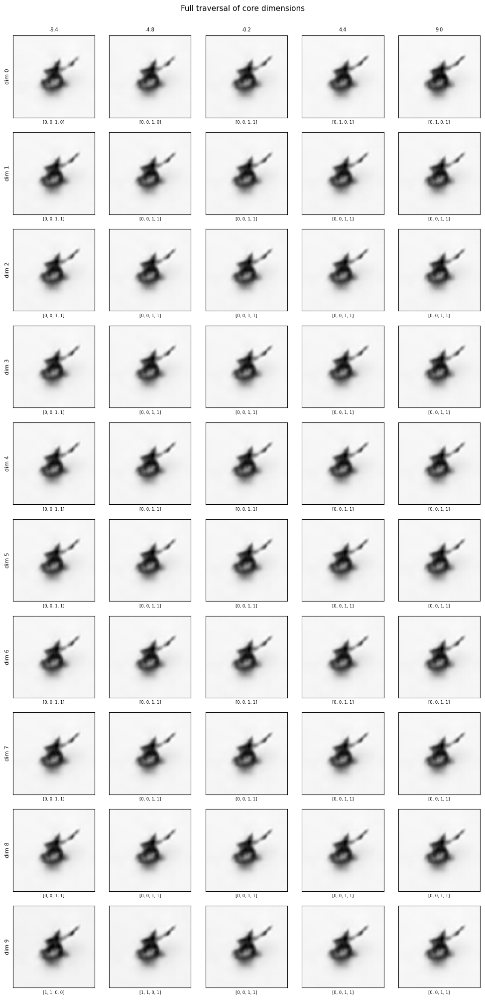

In [ ]:
# usage
rec_and_pred_full_grid(model=model, core=core, style=style,
                       latent_type="core", n_steps=5, means=means, sds=sds)

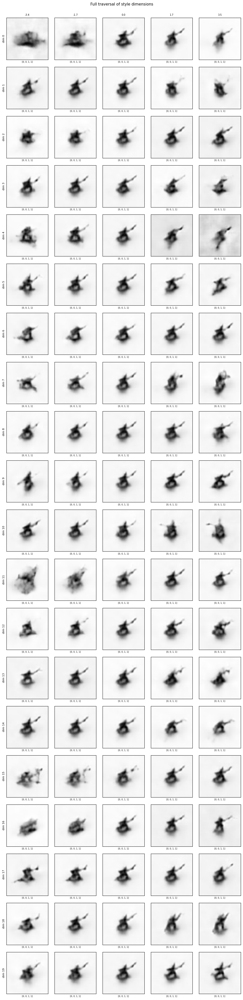

In [ ]:
# usage
rec_and_pred_full_grid(model=model, core=core, style=style,
                       latent_type="style", n_steps=5, means=means, sds=sds)

## Interventional analysis

Take two images that differ only in one ground truth facgor and check whether their core representations differ only in the expected dimension

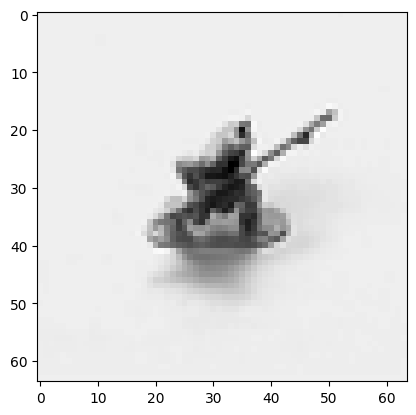

In [ ]:
plt.imshow(data_module.test_dataset[5][0].squeeze(), cmap="gray")


In [ ]:
def interventional_analysis(model, dataset, factor_to_vary=4, n_pairs=100):
    """
    Compare pairs of images that differ only in one factor.
    Check which z_core dimensions change most.
    """
    diffs = []
    used_pairs = set()

    # precompute all factors once for efficiency
    all_factors = np.array([dataset.get_factors(i) for i in range(len(dataset))])

    for _ in range(n_pairs):
      if len(diffs) >= n_pairs:
            break
      for j in range(i+1, len(dataset)):
          if (i, j) in used_pairs:
              continue
          f1 = all_factors[i]
          f2 = all_factors[j]

          # find two samples with same category/instance but different lighting
          # same in all factors except factor_to_vary
          same = all(f1[k] == f2[k] for k in range(5) if k != factor_to_vary)
          different = f1[factor_to_vary] != f2[factor_to_vary]
          if same and different:
            used_pairs.add((i, j))
            # get the two samples
            x1 = dataset[i][0].unsqueeze(0)
            x2 = dataset[j][0].unsqueeze(0)

            # pass the two samples intwo pred model
            with torch.no_grad():
                out1 = model.model.pred_vae(x1)
                out2 = model.model.pred_vae(x2)
            # compute the differences of the core latents between the two samples
            diff = (out1['mean_core'] - out2['mean_core']).abs().squeeze().numpy()
            diffs.append(diff)

            if len(diffs) >= n_pairs:
                break

    diffs = np.array(diffs)
    mean_diff = diffs.mean(axis=0)

    plt.bar(range(10), mean_diff)
    plt.xticks(range(10), [f"z_core_{i}" for i in range(10)])
    plt.title(f"Mean absolute z_core change when varying '{factor_names[factor_to_vary]}'")
    plt.xlabel("Core dimension")
    plt.ylabel("Mean absolute difference")
    plt.show()

    return mean_diff


/tmp/ipykernel_1159/765827492.py:43: RuntimeWarning: Mean of empty slice.
  mean_diff = diffs.mean(axis=0)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


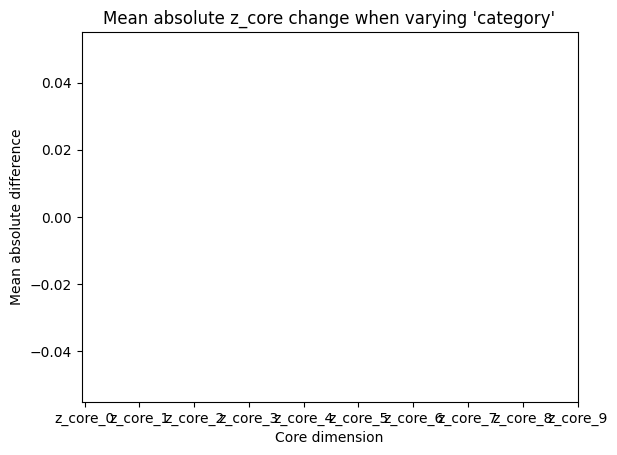

/tmp/ipykernel_1159/765827492.py:43: RuntimeWarning: Mean of empty slice.
  mean_diff = diffs.mean(axis=0)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


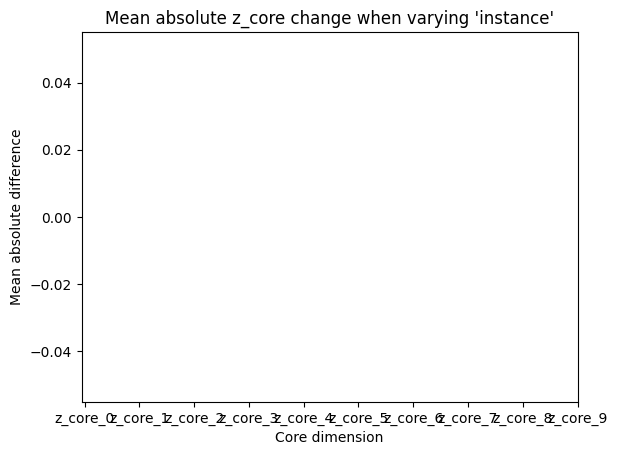

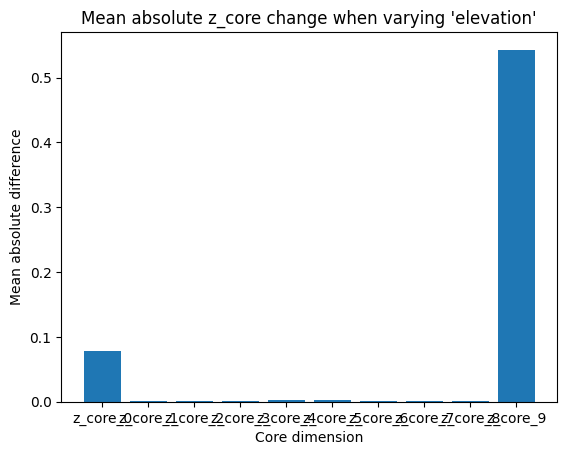

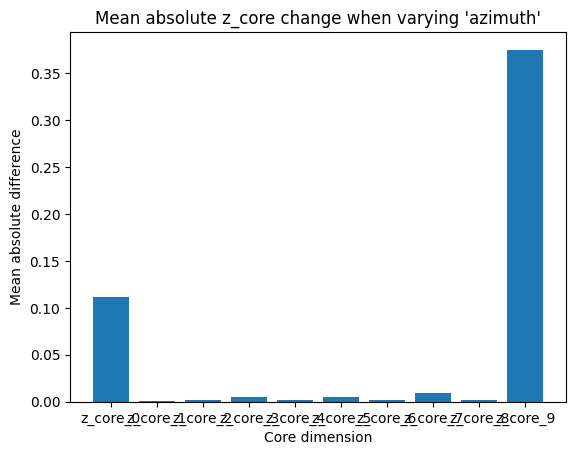

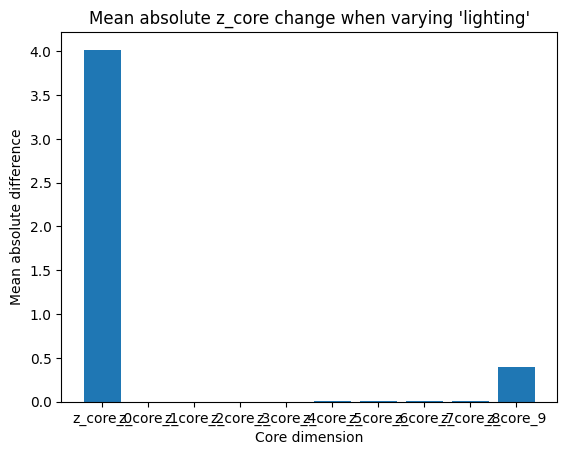

In [ ]:
# run for each factor
for f in range(5):
    interventional_analysis(model, data_module.test_dataset, factor_to_vary=f)

The interventional analysis provides causal evidence for the disentanglement. By constructing pairs of images that differ in exactly one ground truth factor, we can measure how much each core dimension responds to that specific factor. Combined with the classifier weight matrix, this allows us to trace the full path from ground truth factor to latent representation to prediction. For example, varying lighting produces the largest change in z_core_0, which also has the largest weights in the classifier — confirming that z_core_0 is the model's internal representation of the lighting concept that drives label prediction

In [ ]:
def interventional_analysis_with_predictions(model, dataset, factor_to_vary=4, n_pairs=10, all_factors=None):

    label_names = ["veh+light", "veh+dark", "hum+light", "hum+dark"]
    diffs = []
    used_pairs = set()

    for i in range(len(dataset)):
        if len(diffs) >= n_pairs:
            break
        for j in range(i+1, len(dataset)):
            if (i, j) in used_pairs:
                continue

            f1 = all_factors[i]
            f2 = all_factors[j]

            same = all(f1[k] == f2[k] for k in range(5) if k != factor_to_vary)
            different = f1[factor_to_vary] != f2[factor_to_vary]

            if same and different:
                used_pairs.add((i, j))

                x1 = dataset[i][0].unsqueeze(0)
                x2 = dataset[j][0].unsqueeze(0)

                with torch.no_grad():
                    out1 = model.model.pred_vae(x1)
                    out2 = model.model.pred_vae(x2)

                # predictions
                pred1 = (torch.sigmoid(out1['y_pred']) >= 0.5).int().squeeze().tolist()
                pred2 = (torch.sigmoid(out2['y_pred']) >= 0.5).int().squeeze().tolist()

                # core difference
                diff = (out1['mean_core'] - out2['mean_core']).abs().squeeze().numpy()
                diffs.append(diff)

                # --- plot the pair ---
                fig, axes = plt.subplots(1, 2, figsize=(6, 3))

                axes[0].imshow(x1.squeeze().numpy(), cmap="gray")
                active1 = [label_names[k] for k, p in enumerate(pred1) if p == 1]
                axes[0].set_title(f"Sample {i}\n{factor_names[factor_to_vary]}={f1[factor_to_vary]}")
                axes[0].set_xlabel("pred: " + str(pred1) + "\n" + (", ".join(active1) if active1 else "none"))
                axes[0].set_xticks([])
                axes[0].set_yticks([])

                axes[1].imshow(x2.squeeze().numpy(), cmap="gray")
                active2 = [label_names[k] for k, p in enumerate(pred2) if p == 1]
                axes[1].set_title(f"Sample {j}\n{factor_names[factor_to_vary]}={f2[factor_to_vary]}")
                axes[1].set_xlabel("pred: " + str(pred2) + "\n" + (", ".join(active2) if active2 else "none"))
                axes[1].set_xticks([])
                axes[1].set_yticks([])

                # print factor comparison
                fig.suptitle(
                    f"Only '{factor_names[factor_to_vary]}' differs: "
                    f"{f1[factor_to_vary]} → {f2[factor_to_vary]}",
                    fontsize=10
                )
                plt.tight_layout()
                plt.show()

                # print core dimension changes
                print(f"  z_core changes: " +
                      " | ".join([f"z{k}={diff[k]:.3f}" for k in range(len(diff))]))
                print(f"  prediction changed: {pred1 != pred2}")
                print()

                if len(diffs) >= n_pairs:
                    break


In [ ]:

# run for the two meaningful factors
all_factors = np.array([data_module.test_dataset.get_factors(i)
                        for i in range(len(data_module.test_dataset))])


=== Varying INSTANCE ===


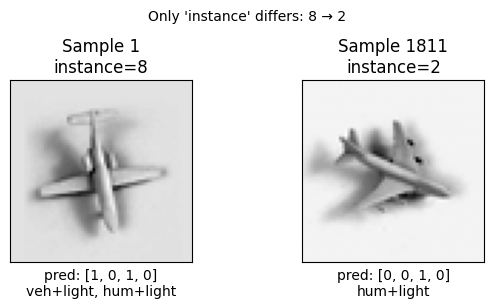

  z_core changes: z0=0.954 | z1=0.000 | z2=0.002 | z3=0.002 | z4=0.001 | z5=0.003 | z6=0.007 | z7=0.003 | z8=0.000 | z9=3.087
  prediction changed: True



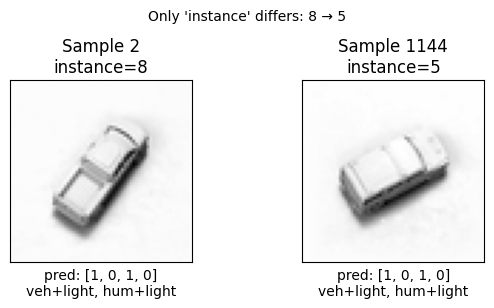

  z_core changes: z0=0.396 | z1=0.000 | z2=0.006 | z3=0.002 | z4=0.010 | z5=0.007 | z6=0.000 | z7=0.003 | z8=0.008 | z9=0.979
  prediction changed: False



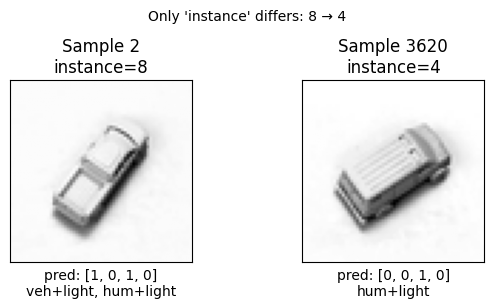

  z_core changes: z0=0.934 | z1=0.004 | z2=0.003 | z3=0.003 | z4=0.007 | z5=0.003 | z6=0.002 | z7=0.005 | z8=0.006 | z9=5.341
  prediction changed: True



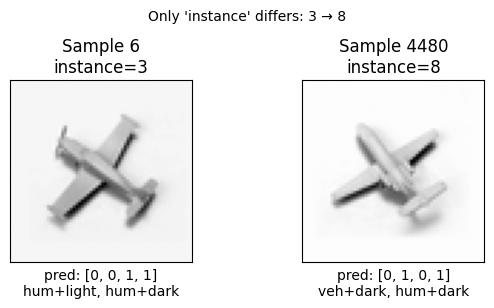

  z_core changes: z0=0.232 | z1=0.001 | z2=0.009 | z3=0.005 | z4=0.002 | z5=0.010 | z6=0.004 | z7=0.009 | z8=0.014 | z9=5.661
  prediction changed: True



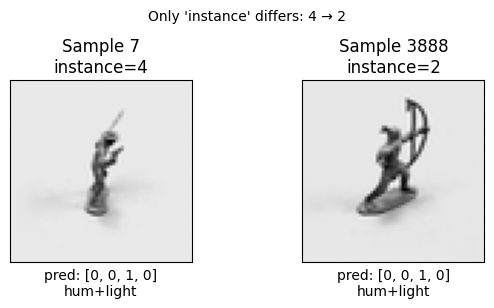

  z_core changes: z0=0.933 | z1=0.009 | z2=0.003 | z3=0.004 | z4=0.000 | z5=0.001 | z6=0.011 | z7=0.004 | z8=0.011 | z9=0.116
  prediction changed: False



In [ ]:

print("=== Varying INSTANCE ===")
interventional_analysis_with_predictions(
    model, data_module.test_dataset,
    factor_to_vary=1, n_pairs=5, all_factors=all_factors)

=== Varying INSTANCE ===


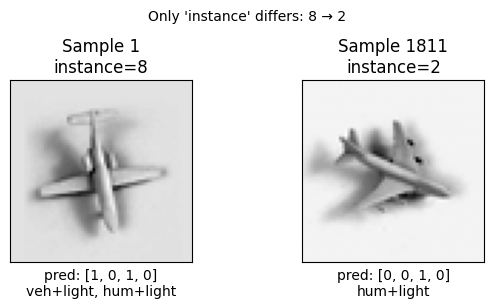

  z_core changes: z0=0.954 | z1=0.000 | z2=0.002 | z3=0.002 | z4=0.001 | z5=0.003 | z6=0.007 | z7=0.003 | z8=0.000 | z9=3.087
  prediction changed: True



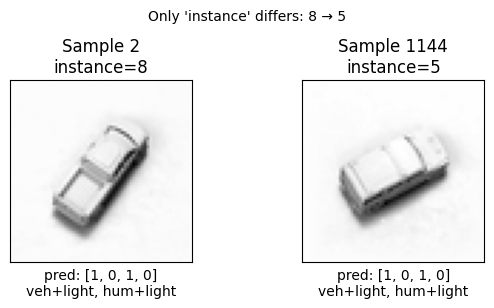

  z_core changes: z0=0.396 | z1=0.000 | z2=0.006 | z3=0.002 | z4=0.010 | z5=0.007 | z6=0.000 | z7=0.003 | z8=0.008 | z9=0.979
  prediction changed: False



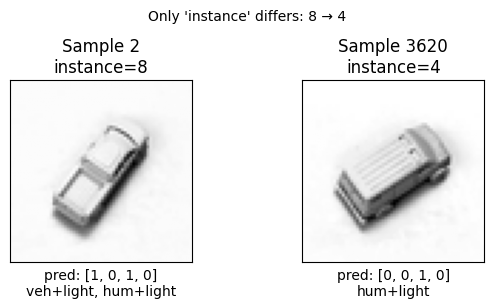

  z_core changes: z0=0.934 | z1=0.004 | z2=0.003 | z3=0.003 | z4=0.007 | z5=0.003 | z6=0.002 | z7=0.005 | z8=0.006 | z9=5.341
  prediction changed: True



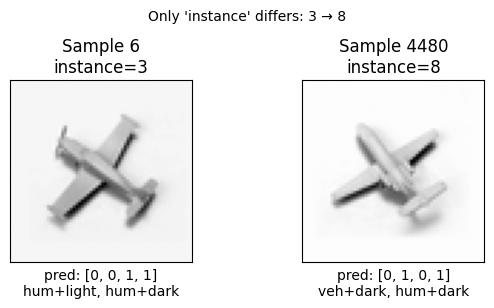

  z_core changes: z0=0.232 | z1=0.001 | z2=0.009 | z3=0.005 | z4=0.002 | z5=0.010 | z6=0.004 | z7=0.009 | z8=0.014 | z9=5.661
  prediction changed: True



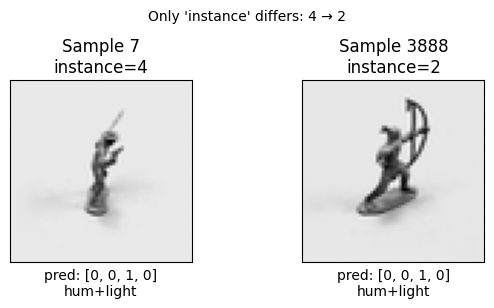

  z_core changes: z0=0.933 | z1=0.009 | z2=0.003 | z3=0.004 | z4=0.000 | z5=0.001 | z6=0.011 | z7=0.004 | z8=0.011 | z9=0.116
  prediction changed: False



In [ ]:
print("=== Varying INSTANCE ===")
interventional_analysis_with_predictions(
    model, data_module.test_dataset,
    factor_to_vary=1, n_pairs=5, all_factors=all_factors)

=== Varying ELEVATION ===


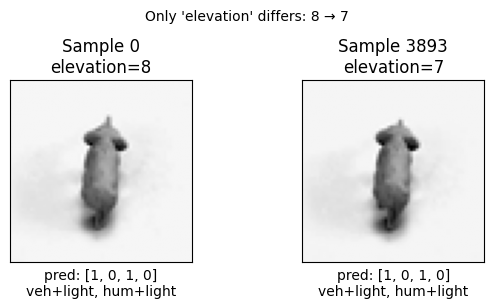

  z_core changes: z0=0.079 | z1=0.000 | z2=0.001 | z3=0.001 | z4=0.002 | z5=0.002 | z6=0.001 | z7=0.001 | z8=0.001 | z9=0.543
  prediction changed: False



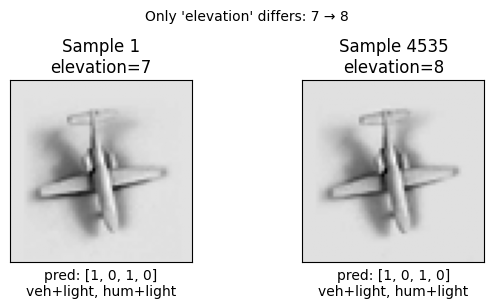

  z_core changes: z0=0.197 | z1=0.000 | z2=0.001 | z3=0.002 | z4=0.001 | z5=0.002 | z6=0.000 | z7=0.001 | z8=0.001 | z9=0.308
  prediction changed: False



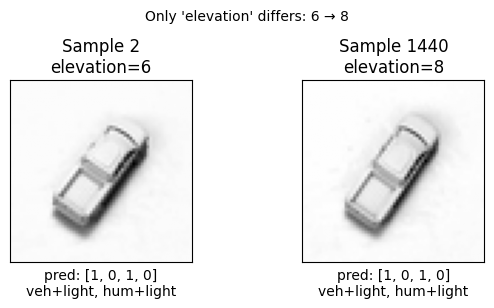

  z_core changes: z0=0.187 | z1=0.001 | z2=0.002 | z3=0.003 | z4=0.004 | z5=0.001 | z6=0.000 | z7=0.002 | z8=0.005 | z9=0.517
  prediction changed: False



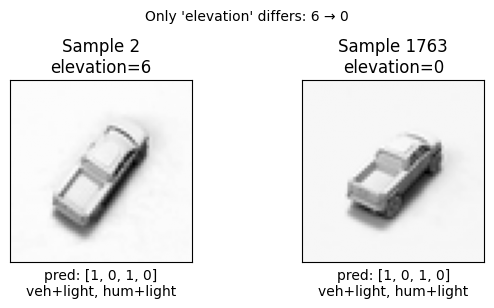

  z_core changes: z0=0.819 | z1=0.004 | z2=0.005 | z3=0.007 | z4=0.003 | z5=0.001 | z6=0.004 | z7=0.001 | z8=0.011 | z9=0.739
  prediction changed: False



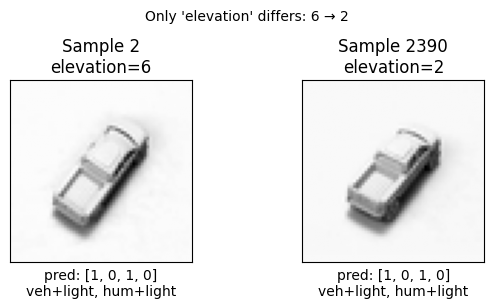

  z_core changes: z0=1.142 | z1=0.002 | z2=0.003 | z3=0.006 | z4=0.000 | z5=0.001 | z6=0.002 | z7=0.000 | z8=0.006 | z9=0.113
  prediction changed: False



In [ ]:
print("=== Varying ELEVATION ===")
interventional_analysis_with_predictions(
    model, data_module.test_dataset,
    factor_to_vary=2, n_pairs=5, all_factors=all_factors)

=== Varying ELEVATION (should NOT change prediction) ===


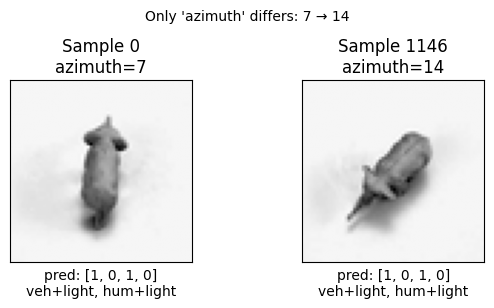

  z_core changes: z0=0.107 | z1=0.000 | z2=0.001 | z3=0.003 | z4=0.001 | z5=0.007 | z6=0.003 | z7=0.013 | z8=0.003 | z9=0.296
  prediction changed: False



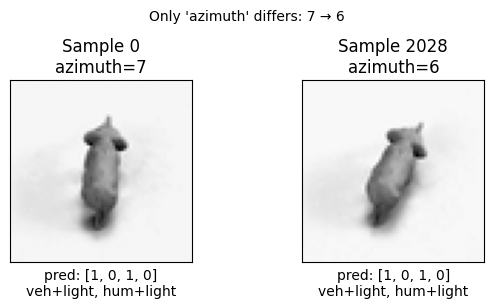

  z_core changes: z0=0.115 | z1=0.002 | z2=0.003 | z3=0.006 | z4=0.003 | z5=0.002 | z6=0.001 | z7=0.006 | z8=0.001 | z9=0.454
  prediction changed: False



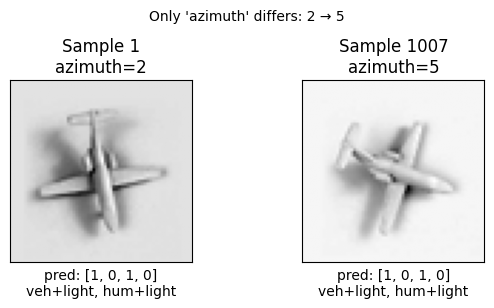

  z_core changes: z0=0.079 | z1=0.005 | z2=0.003 | z3=0.005 | z4=0.002 | z5=0.002 | z6=0.004 | z7=0.003 | z8=0.001 | z9=1.487
  prediction changed: False



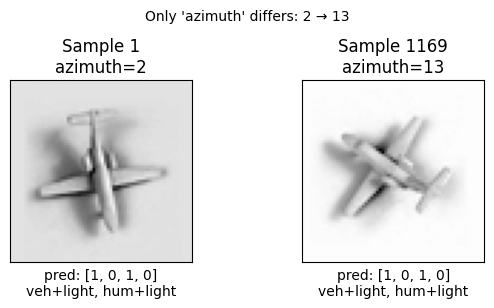

  z_core changes: z0=0.083 | z1=0.005 | z2=0.003 | z3=0.001 | z4=0.005 | z5=0.002 | z6=0.001 | z7=0.001 | z8=0.003 | z9=0.452
  prediction changed: False



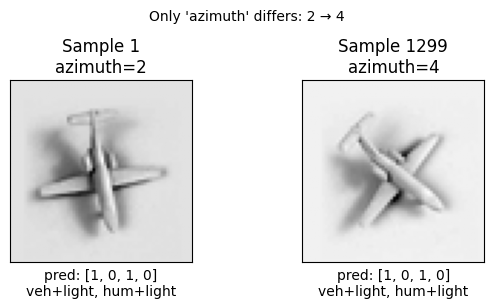

  z_core changes: z0=0.546 | z1=0.002 | z2=0.001 | z3=0.002 | z4=0.002 | z5=0.003 | z6=0.002 | z7=0.000 | z8=0.001 | z9=0.490
  prediction changed: False



In [ ]:
print("=== Varying AZIMUTH ===")
interventional_analysis_with_predictions(
    model, data_module.test_dataset,
    factor_to_vary=3, n_pairs=5, all_factors=all_factors)

=== Varying LIGHTING ===


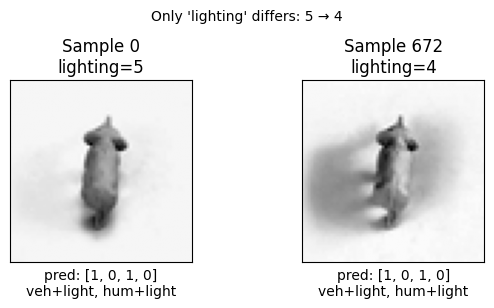

  z_core changes: z0=0.660 | z1=0.001 | z2=0.000 | z3=0.001 | z4=0.001 | z5=0.006 | z6=0.003 | z7=0.001 | z8=0.004 | z9=0.130
  prediction changed: False



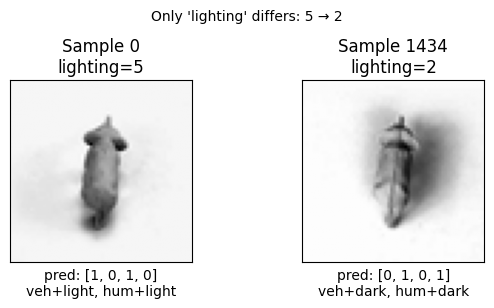

  z_core changes: z0=7.373 | z1=0.002 | z2=0.001 | z3=0.003 | z4=0.001 | z5=0.004 | z6=0.012 | z7=0.005 | z8=0.006 | z9=0.668
  prediction changed: True



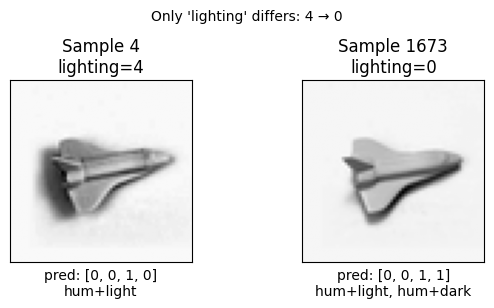

  z_core changes: z0=2.852 | z1=0.007 | z2=0.010 | z3=0.010 | z4=0.000 | z5=0.005 | z6=0.005 | z7=0.004 | z8=0.003 | z9=2.759
  prediction changed: True



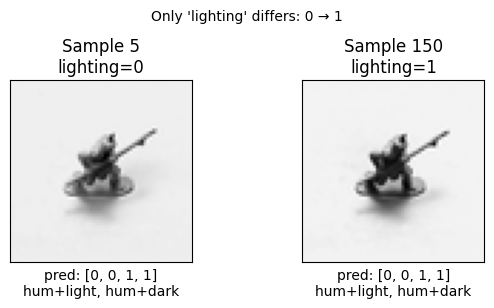

  z_core changes: z0=0.758 | z1=0.004 | z2=0.004 | z3=0.004 | z4=0.002 | z5=0.000 | z6=0.004 | z7=0.003 | z8=0.001 | z9=0.809
  prediction changed: False



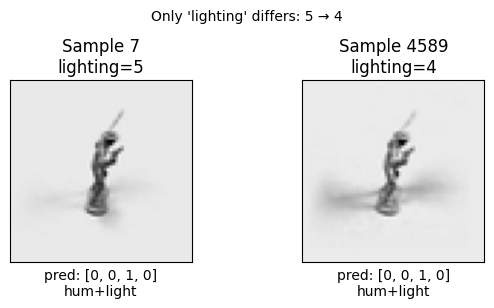

  z_core changes: z0=0.785 | z1=0.002 | z2=0.003 | z3=0.004 | z4=0.004 | z5=0.002 | z6=0.001 | z7=0.006 | z8=0.001 | z9=0.439
  prediction changed: False



In [ ]:
print("=== Varying LIGHTING ===")
interventional_analysis_with_predictions(
    model, data_module.test_dataset,
    factor_to_vary=4, n_pairs=5, all_factors=all_factors)